# **Сборный проект-5: Поиск изображения по запросу**

### **Описание проекта**

Вы работаете в фотохостинге для профессиональных фотографов «Со Смыслом» (“With Sense”).

Ваши пользователи размещают свои фотографии на хостинге и сопровождают их полным описанием: указывают место съёмок, модель камеры и т. д. Отличительная особенность сервиса — описание: его может предоставить не только тот, кто размещает фотографию, но и другие пользователи портала. Например, для этой фотографии

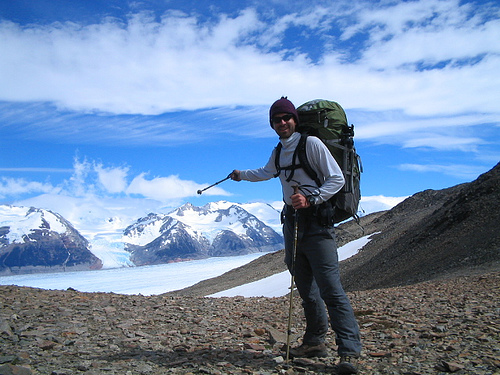

описание выглядит так:

⎢ A hiker poses for a picture in front of stunning mountains and clouds.

Ваш отдел занимается экспериментом по разработке поиска референсных фотографий для фотографов. Суть поиска заключается в следующем: пользователь сервиса вводит описание нужной сцены. Например, такое:

⎢ A man is crossing a mountain pass on a metal bridge.

Сервис выводит несколько фотографий с такой же или похожей сценой.

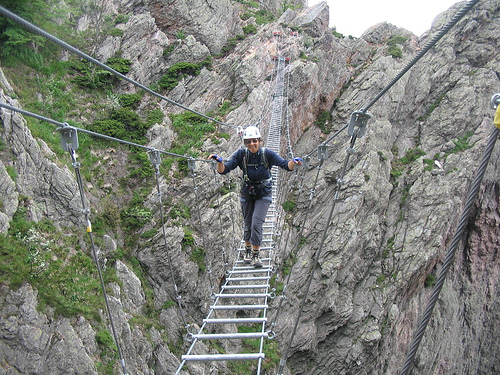

Чтобы эксперимент получил право на жизнь, нужно защитить его перед руководителем компании. Для защиты необходимо презентовать так называемый PoC (Proof of Concept, Проверка концепции) — продемонстрировать, что такой проект практически осуществим. Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно выбрать лучшую  модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — и покажет, насколько текст и картинка подходят друг другу.

На основе лучшей модели можно будет собрать предварительную версию продукта, которую вы покажете руководителю компании.



### **Юридические ограничения**

В некоторых странах, где работает компания With Sense, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно, текстов, изображений, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16-ти лет.
В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:
⎢ This image is unavailable in your country in compliance with local laws.
Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому необходимо очистить данные от проблемного контента. Во время тестирования модели при появлении в запросе “вредного” контента должен отображаться дисклеймер.


### **Цель проекта**

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

Также необходимо учитывать юридические ограничения, действующие в некоторых странах.

### **Описание данных**

Данные доступны по [ссылке] *# ссылки сделаны неработоспособными в рамках этичности работы с предоставляемыми данными*

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

### **План проекта**

**Шаг 1.** Загрузка данных и проведение исследовательского аналиаз данных
- Скачка и открытие файлов с данными. Проверка данных и их корректировка, если потребуется.

**Шаг 2.** Подготовка данных к обучению модели
- Создание списка слов которые, по моему мнению, могут попадать под юридические ограничения.
- Исключение из обучающего датасета пар, которые, исходя из подготовленного ранее списка слов, могут попадать под юридические ограничения.
- Векторизацию текстового описания одним из следующих методов:   
  - TF-IDF;
  - BERT;
  - word2vec.
- Векторизацию изображений с использованием модели ResNet50 из библиотеки Keras или PyTorch.
- Создание описаний получившихся пар векторов с точки зрения их размерностей.

**Шаг 3.** Обучение моделей
- Создание модели, которая покажет близость двух векторов. Модель должна принимать на вход конкатенированный вектор, состоящий из векторов описания и изображений, и предсказывать итоговую оценку экспертов.
- Выбор метрику, по которой я буду сравнивать точность различных моделей.
- Обучение несколько моделей и подборка их гиперпараметров. В качестве моделей обязательно нужно рассмотреть:
  - 1. Линейную регрессию;
  - 2. Полносвязные нейронные сети.

**Шаг 4.** Тестирование модели и демонстрация ее работы
- Проведение тестирований лучшей модели на тестовых данных.
- Написание функции, которая принимает на вход текстовое описание, делает его векторизацию и возвращает картинку с максимальным значением метрики.

💡 Если запрос ведёт на юридически вредный контент, функция должна выводить дисклеймер.

- С помощью этой написанной функции провести тестирование работы модели на нескольких текстовых описаниях: проверить, какие картинки она выдает при различных текстовых запросах.

**Шаг 5.** Сделать общий вывод по работе
- Описать модель, которая лучше всего справляется с задачей сравнения сходства картинки и текста. Описать, какие ошибки допускает модель во время поиска картинки по её текстовому описанию. Оценить, насколько проект по созданию сервиса поиска фотографий по текстовому описанию практически осуществим.

## **Подготовка среды**

Прежде чем приступать к работе необходимо подготовить среду для этого.

In [ ]:
# для (первичного за "визит"?) запроса доступа к хранящимся на гугл-диске данным
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# !pip list # проверка исходных библиотек и их версий

In [ ]:
# подключаем библиотеки
import os # для работы с операционной системой (например, каталогами и путями)

import pandas as pd # работа с данными в формате таблиц
import numpy as np  # математические операции и работа с массивами
import time # расчет времени выполнения функций
import random # работа со случайностями
import math # расширение математических функций

# визуализация данных
import matplotlib.pyplot as plt # для некоторых графиков
import seaborn as sns # для некоторых графиков и матриц

# визуализация прогресса
from tqdm.auto import tqdm  # автоматический выбор режима
#from tqdm.notebook import tqdm # версия для ноутбука юпитер, может не работать в другой среде
tqdm.pandas()  # активируем progress_apply для pandas

# подготовка к работе с моделями
from sklearn.preprocessing import StandardScaler # скалер
from sklearn.base import BaseEstimator # создание совместимых со sklearn моделей
# разбиение на выборки, чтобы одно и то же изображение не попало в тестовую и валидационную
from sklearn.model_selection import GroupShuffleSplit
# метрики
from sklearn.metrics import mean_squared_error
# модели
from sklearn.dummy import DummyRegressor # Дамми-модель
from sklearn.linear_model import LinearRegression # линейная регрессия
from sklearn.tree import DecisionTreeRegressor # дерево решений

# нейронные сети (PyTorch)
import torch # основная библиотека для работы с тензорами и построения нейронных сетей
import torch.nn as nn #  содержит различные классы и функции для построения слоёв нейронных сетей
import torchvision.models as models # доступ к предварительно обученным моделям для компьютерного зрения
from torch.optim import Adam # оптимизаторы
from torch.utils.data import DataLoader, Dataset # инструменты для работы с наборами данных

from torchvision import transforms # библиотека с дополнительными модулями для работы с компьютерным зрением, включая преобразования изображений
# библиотека, которая предоставляет доступ к различным моделям для обработки естественного языка
# и компьютерного зрения, обученным на больших объёмах данных
from transformers import (AutoModel, # класс для работы с предварительно обученными моделями
                          AutoTokenizer, # класс для токенизации текста
                          ViTFeatureExtractor, # класс для извлечения признаков из изображений с помощью модели Vision Transformer
                          ViTForImageClassification) #  класс для классификации изображений с помощью модели Vision Transformer

# работа с изображением (дополнительно)
from PIL import Image # один из вариантов для загрузки изображений

In [ ]:
# !pip list # дополнительная проверка библиотек и их версий

In [ ]:
# задаем настройки отображения
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
pd.options.display.float_format ='{:,.2f}'.format
sns.set_theme(style='whitegrid', palette='pastel')
sns.set_context(
    'notebook',
    rc={
        'font.size':12,
        'axes.titlesize':16,
        'axes.labelsize':12,
        'legend.fontsize':12,
        'figure.figsize':(14, 7)
    }
)

# отключаем предупреждения:
# когда используется функционал, который в будущем может измениться или устареть
#warnings.simplefilter(action='ignore', category=FutureWarning)
# когда выполняется присваивание значений через несколько индексов или атрибутов,
# и библиотека не может однозначно определить, является ли это намеренным действием или потенциальной ошибкой
#pd.options.mode.chained_assignment = None

# задаем класс для стилизации вывода метода .print()
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

In [ ]:
# устанавливаем константы
# задаем константы
# для фиксации объектов тренировочной и тестовой выборок
RANDOM_STATE = 42
# для пропорционального разделения датасета на тренировочную и тестовую выборки
TEST_SIZE = 0.3
TRAIN_SIZE = 0.7

# Установка seed'ов для воспроизводимости
SEED = 42 # кое-где вместо привычного RANDOM_STATE

# определяем устройство
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Используется устройство: {device}")

#import random # работа со случайностями
torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)
##torch.cuda.manual_seed(SEED)
##torch.backends.cudnn.deterministic = True # делает CUDA операции детерминированными
##torch.backends.cudnn.benchmark = False # отключаем автотюнинг для воспроизводимости

Используется устройство: cpu


Для удобства читаемости кода также зададим константу для пути загрузки.

In [ ]:
# обозначаем путь загрузки
PATH = '/content/drive/MyDrive/datasets/to_upload/'

Также зададим список слов, которые могут потенциально относится к запрещенному контенту.

In [ ]:
# стоп-слова
WORD_TO_BLOCK = ['baby', 'babies', 'toddler', 'toddlers', 'infant', 'infants', 'child', 'children',
                 'kid', 'kids','teen', 'teens', 'teenager', 'teenagers',
                 'youngster', 'boy', 'boys', 'girl', 'girls', 'underaged', 'underage',
                'schooler', 'schoolers', 'schoolboy', 'schoolboys', 'schoolgirl', 'schoolgirls']

### **Выводы**

Мы загрузили и подключили необходимые для работы библиотеки, настроили отображение, а также задали константы.



## **Исследовательский анализ данных**

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


### **train_dataset.csv и test_queries.csv**

Для удобства будем изучать наши данные по-отдельности, но при этом в рамках логических групп (для удобства сравнения)

In [ ]:
# функция для краткого обзора и описания
def first_discr(data, titl, num):

  print(color.BLUE + color.BOLD + f"\n === Первые {num} строк в {titl}: ===\n" + color.END)
  display(data.head(num))

  print(color.BLUE + color.BOLD + f"\n === Общая информация о данных в {titl}: ===\n" + color.END)
  display(data.info())

  print(color.BLUE + color.BOLD + f"\n === Размер датасета {titl}:===\n" + color.END + f"    {data.shape}\n")

  print(color.BLUE + color.BOLD + f"\n === Явные дубликаты в {titl}:===" + color.END)
  print(color.BLUE + color.BOLD +f"Количество: "+ color.END + f"{data.duplicated().sum()}")
  print(color.BLUE + color.BOLD +f"Процент: "+ color.END +
      f"{data.duplicated().sum()/len(data)*100:.2f} %")

  return

In [ ]:
# загрузка тренировочных данных
# с выводом типа ошибки
try:
    train_dataset = pd.read_csv(os.path.join(PATH, 'train_dataset.csv'))
    print(color.BLUE + color.BOLD + f"Тренировочные данные успешно загружены!" + color.END)
except Exception as e:
    print(color.RED + color.BOLD + f"Ошибка: "+ color.END + f"{e}")

Тренировочные данные успешно загружены!


In [ ]:
# Вызов функции discr_num и ее вывод
first_discr(train_dataset,'train_dataset', 15)


 === Первые 15 строк в train_dataset: ===



,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .



 === Общая информация о данных в train_dataset: ===

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


None


 === Размер датасета train_dataset:===
    (5822, 3)


 === Явные дубликаты в train_dataset:===
Количество: 0
Процент: 0.00 %


Имена столбцов соответствуют правилам хорошего тона, типы данных соответствуют содержимому.

Текст описаний - английский, в видимой части начинаются с прописной буквы, но основной текст составляют строчные буквы. Числа не обнаружены.

Явные пропуски и явные дубликаты также не обнаружены.

In [ ]:
# загрузка тестовых данных
# с выводом типа ошибки
try:
    test_queries = pd.read_csv(os.path.join(PATH, 'test_queries.csv'), sep='|')
    print(color.BLUE + color.BOLD + f"Тестовые данные успешно загружены!" + color.END)
except Exception as e:
    print(color.RED + color.BOLD + f"Ошибка: "+ color.END + f"{e}")

Тестовые данные успешно загружены!


In [ ]:
# Вызов функции discr_num и ее вывод
first_discr(test_queries,'test_queries', 15)


 === Первые 15 строк в test_queries: ===



,Unnamed: 0,query_id,query_text,image
0,0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .",1177994172_10d143cb8d.jpg
1,1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at each other .,1177994172_10d143cb8d.jpg
4,4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each other .,1177994172_10d143cb8d.jpg
5,5,1232148178_4f45cc3284.jpg#0,A baby girl playing at a park .,1232148178_4f45cc3284.jpg
6,6,1232148178_4f45cc3284.jpg#1,A closeup of a child on a playground with adult supervision .,1232148178_4f45cc3284.jpg
7,7,1232148178_4f45cc3284.jpg#2,A young boy poses for a picture in front of a playground .,1232148178_4f45cc3284.jpg
8,8,1232148178_4f45cc3284.jpg#3,A young girl is smiling in front of the camera at a park .,1232148178_4f45cc3284.jpg
9,9,1232148178_4f45cc3284.jpg#4,There is a little blond hair girl with a green sweatshirt and a red shirt playing on a playground .,1232148178_4f45cc3284.jpg



 === Общая информация о данных в test_queries: ===

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  500 non-null    int64 
 1   query_id    500 non-null    object
 2   query_text  500 non-null    object
 3   image       500 non-null    object
dtypes: int64(1), object(3)
memory usage: 15.8+ KB


None


 === Размер датасета test_queries:===
    (500, 4)


 === Явные дубликаты в test_queries:===
Количество: 0
Процент: 0.00 %


Имена столбцов соответствуют правилам хорошего тона, типы данных соответствуют содержимому.

Текст описаний - английский, в видимой части начинаются с прописной буквы, но основной текст составляют строчные буквы. Могут иметь или не иметь в конце точку. Числа не обнаружены.

Порядок столбцов отличается от такового в тренировочных данных.

Явные пропуски и явные дубликаты также не обнаружены.

Размер тестовой выборки более чем в 11 раз меньше тренировочной.

Также мы имеем безымянный столбец, вероятно дублирующий индекс. Избавиться от него мы можем несколькими путями:
- перезагрузить датасет заново, используя pd.read_csv('...', index_col=0).
- удалить столбец в уже загруженном затасете.

Чтобы не обращаться заново к месту хранения информации за новой загрузкой, быстрее будет удалить столбец у уже имеющегося датасета. Но сначала подтвердим наше предположение.

In [ ]:
# проверяем распределение данных признака Unnamed: 0 на монотонность,
# выводим стат данные
display(test_queries['Unnamed: 0'].is_monotonic_increasing) # по возрастанию
display(test_queries['Unnamed: 0'].is_monotonic_decreasing) # по убыванию
display(test_queries['Unnamed: 0'].describe()) # стат описание

True

False

,Unnamed: 0
count,500.00
mean,249.50
std,144.48
min,0.00
25%,124.75
50%,249.50
75%,374.25
max,499.00


Выходит, что данный столбец - полный дубликат индексов. Избавимся от него, а заодно сменим порядок столбцов для удобства.

In [ ]:
# удаляем столбец 'Unnamed: 0' если он существует
test_queries = test_queries.drop('Unnamed: 0', axis=1, errors='ignore')

# меняем порядок столбцов
test_queries = test_queries[['image', 'query_id', 'query_text']]

test_queries.head(10) # проверяем

,image,query_id,query_text
0,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight ."
1,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .
2,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water
3,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at each other .
4,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each other .
5,1232148178_4f45cc3284.jpg,1232148178_4f45cc3284.jpg#0,A baby girl playing at a park .
6,1232148178_4f45cc3284.jpg,1232148178_4f45cc3284.jpg#1,A closeup of a child on a playground with adult supervision .
7,1232148178_4f45cc3284.jpg,1232148178_4f45cc3284.jpg#2,A young boy poses for a picture in front of a playground .
8,1232148178_4f45cc3284.jpg,1232148178_4f45cc3284.jpg#3,A young girl is smiling in front of the camera at a park .
9,1232148178_4f45cc3284.jpg,1232148178_4f45cc3284.jpg#4,There is a little blond hair girl with a green sweatshirt and a red shirt playing on a playground .


Как мы помним из описания данных, для одной картинки может быть доступно до 5 описаний, а идентификатор описания имеет формат `'<имя файла изображения>#<порядковый номер описания>'`. Из этого и наблюдаемого при кратком обзоре мы можем предположить, что конкретное описание из `'query_text'` создано и соответствует конкретному изображению из `'query_id'`. Визуально проверим это позже.

Также мы наблюдаем, что для кадого изображения представлены несколько вариантов описания (вместе с именем изображения, которому принадлежит описание).

Проверим на наличие явных и неявных дубликатов.

In [ ]:
# функция для подсчета уникальных значений:
def uniq_num(data, title, col_names):
    for col in col_names:
        print(
            color.BLUE + color.BOLD + f"Количество уникальных значений в столбце {col} датасета {title}: " +
            color.END + f"{data[col].nunique()}"
        )

In [ ]:
# применяем функцию uniq_num
# на тренировочных данных
uniq_num(train_dataset, 'train_dataset', train_dataset.columns)

Количество уникальных значений в столбце image датасета train_dataset: 1000
Количество уникальных значений в столбце query_id датасета train_dataset: 977
Количество уникальных значений в столбце query_text датасета train_dataset: 977


In [ ]:
# проверяем количество уникальных картинок, чье описание было взято за основу
print(color.BLUE + color.BOLD + f"Количество уникальных .jpg значений у тренировочных данных: " + color.END + f"{train_dataset['query_id'].str.split('#').str[0].nunique()}")
# проверяем количество уникальных вариантов описания
print(color.BLUE + color.BOLD + f"Количество вариантов номеров описаний для .jpg у тренировочных данных: "
+ color.END + f"{train_dataset['query_id'].str.split('#').str[1].nunique()}")

Количество уникальных .jpg значений у тренировочных данных: 977
Количество вариантов номеров описаний для .jpg у тренировочных данных: 1


Описываемых изображений больше, чем изображений, чье описание они на себя "примеряют" и везде используются лишь описания по номером 2.

Проверим это.

In [ ]:
# проверка количества уникальных пар изображения (.ipg) и принадлежащего ему описания
unique_pairs_count = (
    train_dataset
    .assign(query_id_part=lambda x: x['query_id'].str.split('#').str[0])
    [['query_id_part', 'query_text']]
    .drop_duplicates()
    .shape[0]
)

print(color.BLUE + color.BOLD + f"Уникальных связок у тренировочных данных: " + color.END +f"{unique_pairs_count}")

Уникальных связок у тренировочных данных: 977


Так и есть. То есть значения столбца `'query_id'` нам нужны лишь для визульного изучения самих изображений (и - возможно, для объединения табличного датасета с самими изображениями), а после от них можно избавиться.

Теперь исследуем тестовые данные.

In [ ]:
# применяем функцию uniq_num
# на тестовых данных
uniq_num(test_queries, 'test_queries', test_queries.columns)

Количество уникальных значений в столбце image датасета test_queries: 100
Количество уникальных значений в столбце query_id датасета test_queries: 500
Количество уникальных значений в столбце query_text датасета test_queries: 500


In [ ]:
# проверяем количество уникальных картинок, чье описание было взято за основу
print(color.BLUE + color.BOLD + f"Количество уникальных .jpg значений у тестовых данных: " + color.END + f"{test_queries['query_id'].str.split('#').str[0].nunique()}")

# проверяем количество уникальных вариантов описания
print(color.BLUE + color.BOLD + f"Количество вариантов номеров описаний для .jpg у тестовых данных: "
+ color.END + f"{test_queries['query_id'].str.split('#').str[1].nunique()}")

Количество уникальных .jpg значений у тестовых данных: 100
Количество вариантов номеров описаний для .jpg у тестовых данных: 5


In [ ]:
# проверка количества уникальных пар изображения (jpg) и принадлежащего ему описания
unique_pairs_count = (
    test_queries
    .assign(query_id_part=lambda x: x['query_id'].str.split('#').str[0])
    [['query_id_part', 'query_text']]
    .drop_duplicates()
    .shape[0]
)

print(color.BLUE + color.BOLD + f"Уникальных связок у тестовых данных: " + color.END +f"{unique_pairs_count}")

Уникальных связок у тестовых данных: 500


Количество уникальных описываемых изображений совпадает с количеством вариантов описания. Количество вариантов связок "изображение-принадлежащее ему описание" также совпадает по количеству с вариантами этих самых описаний и "родных" изображений.

Также каждому описываемому изображению (которых 100) соответствует по 5 вариантов описания (всего их 500), что соответсвует описанию.

Сравним наши датасеты на предмет совпадений.

In [ ]:
# проверка на пересечение данных
print(color.BLUE + color.BOLD + f"Уникальных текстовых описаний, которые есть в обоих наборах: " + color.END
      +f"{len(set(train_dataset['query_text']) & set(test_queries['query_text']))}")
print(color.BLUE + color.BOLD + f"Уникальных описываемых изображений, которые есть в обоих наборах: " + color.END
      +f"{len(set(train_dataset['image']) & set(test_queries['image']))}")

Уникальных текстовых описаний, которые есть в обоих наборах: 0
Уникальных описываемых изображений, которые есть в обоих наборах: 0


Ни описываемые изображения, ни текстовые описания не совпадают у обоих датасетов, что говорит о качественном разбиении.



#### **Выводы**

- Мы загрузили датасеты с наименованиями изображений и их описанием, а также изучили их.
- Имена столбцов соответствуют правилам хорошего тона, типы данных соответствуют содержимому.
- Текст описаний - английский, в видимой части начинаются с прописной буквы, но основной текст составляют строчные буквы. Могут иметь или не иметь в конце точку. Числа не обнаружены.
- Явных пропусков и дубликатов также не обнаружено.
- Для описаний изображений в тренировочном датасете использовались лишь описания с постфиксом 2 (и одно может применяться несколько раз), тогда как для каждого из тестовых изображений могли использоваться все 5 описаний от каждого "исходного изображения".
- Ни уникальные "изучаемые" изображения, ни уникальные текстовые описание не попали сразу в тренировочный и тестовый датасет, что говорит о хорошем качестве разбиения (создания) выборок.
- Размер тестовой выборки более чем в 11 раз меньше тренировочной.

### **Оценки соответствия**

Загрузим наши данные с оценками соответствия. Начнем с мнения экспертов, как с более весомых.

In [ ]:
# загрузка мнения экспертов
# с выводом типа ошибки
try:
    exp_annot = pd.read_csv(os.path.join(PATH, 'ExpertAnnotations.tsv'),
                            delimiter='\t', # разделитель
                            header=None) # обозначение,что у файла нет строки с заголовками столбцов, и они будут пронумерованы автоматически
    print(color.BLUE + color.BOLD + f"Данные с оценкой экспертов успешно загружены!" + color.END)
except Exception as e:
    print(color.RED + color.BOLD + f"Ошибка: "+ color.END + f"{e}")

Данные с оценкой экспертов успешно загружены!


In [ ]:
# Вызов функции discr_num и ее вывод
first_discr(exp_annot,'exp_annot', 15)


 === Первые 15 строк в exp_annot: ===



,0,1,2,3,4
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,1,1,1
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,1,1,2
8,106490881_5a2dd9b7bd.jpg,1425069308_488e5fcf9d.jpg#2,1,1,1
9,106490881_5a2dd9b7bd.jpg,1714316707_8bbaa2a2ba.jpg#2,2,2,2



 === Общая информация о данных в exp_annot: ===

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       5822 non-null   object
 1   1       5822 non-null   object
 2   2       5822 non-null   int64 
 3   3       5822 non-null   int64 
 4   4       5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB


None


 === Размер датасета exp_annot:===
    (5822, 5)


 === Явные дубликаты в exp_annot:===
Количество: 0
Процент: 0.00 %


Имена у столбцов отсутствуют, поэтому чуть позже дадим им имена, сответсвующие таковым у тренировочных данных.

Типы данных соответствуют содержимому, пропусков и дубликатов не обнаружено.

Количество строк совпадает с таковым у тренировочных данных, и в видимой части также используются описания под номером 2, что дает надежду на то, что ни одна из строк в тренировочных данных не останется без своей оценки.

Также мы также наблюдаем, что как минимум для первого изображения доступно целых 7 описаний.

Дадим имена столбцам для удобства применения.

In [ ]:
# именование столбцов
exp_annot.columns = ['image', 'query_id', 'first_exp', 'second_exp', 'third_exp']
exp_annot.head() # проверка

,image,query_id,first_exp,second_exp,third_exp
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


Исследуем "нечисловые данные".

In [ ]:
# применяем функцию uniq_num
# на тестовых данных
uniq_num(exp_annot, 'exp_annot', exp_annot.columns)

Количество уникальных значений в столбце image датасета exp_annot: 1000
Количество уникальных значений в столбце query_id датасета exp_annot: 977
Количество уникальных значений в столбце first_exp датасета exp_annot: 4
Количество уникальных значений в столбце second_exp датасета exp_annot: 4
Количество уникальных значений в столбце third_exp датасета exp_annot: 4


При этом количество уникальных изучаемых изображений и количество описаний совпадает с таковыми для тренировочных данных.

Каждый из экспертов выставлял разные оценки, которые мы изучим чуть позже.

In [ ]:
# проверяем количество уникальных картинок, чье описание было взято за основу
print(color.BLUE + color.BOLD + f"Количество уникальных .jpg значений: " + color.END + f"{exp_annot['query_id'].str.split('#').str[0].nunique()}")

# проверяем количество уникальных вариантов описания
print(color.BLUE + color.BOLD + f"Количество вариантов номеров описаний для .jpg: "
+ color.END + f"{exp_annot['query_id'].str.split('#').str[1].nunique()}")

Количество уникальных .jpg значений: 977
Количество вариантов номеров описаний для .jpg: 1


Здесь также использовались описания лишь с постфиксом 2, и также одно описание могло быть использовано несколько раз.

Теперь посмотрим на сами оценки внимательнее. Как мы помним, эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

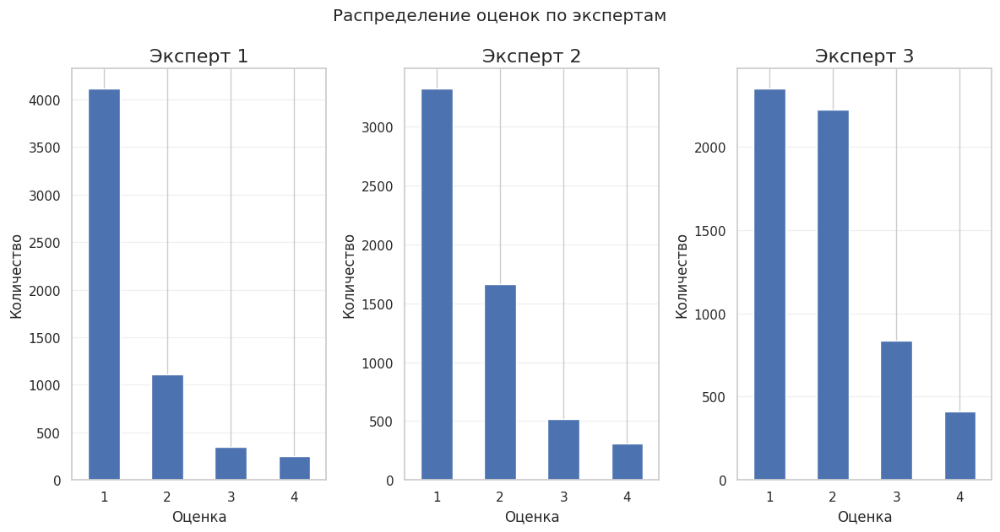

In [ ]:
# распределение оценок по экспертам
plt.figure(figsize=(12, 6))
for i, col in enumerate(['first_exp', 'second_exp', 'third_exp'], 1):
    plt.subplot(1, 3, i)
    exp_annot[col].value_counts().sort_index().plot(kind='bar', color='#4C72B0')
    plt.title(f'Эксперт {i}')
    plt.xlabel('Оценка')
    plt.ylabel('Количество')
    plt.xticks(rotation=0)
    plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.suptitle('Распределение оценок по экспертам', y=1.05)
plt.show()

Мы можем наблюдать, что первый эксперт наиболее строгий, а третий напротив, наиболее лояльный к соответствию.

И уже можем предполагать, что по мнению экспертов большинство изображений не соответсвуют описанию. Но проверим дополнительно.

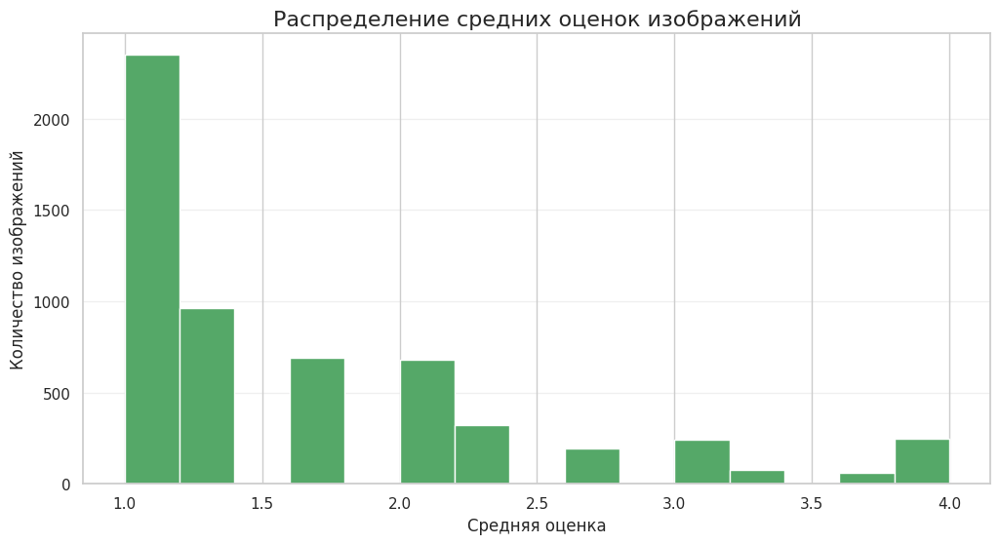

In [ ]:
# распределение средних оценок изображений
plt.figure(figsize=(12, 6))
exp_annot[['first_exp', 'second_exp', 'third_exp']].mean(axis=1).hist(bins=15, color='#55A868', edgecolor='white')
plt.title('Распределение средних оценок изображений')
plt.xlabel('Средняя оценка')
plt.ylabel('Количество изображений')
plt.grid(axis='y', alpha=0.3)
plt.show()

Да, несмотря на возможность градации степени несоответствия большинство изображений не соответствуют описанию полностью. Что в прининципе логично для изображений.

Взглянем также на оценки с краунсорсинга.

In [ ]:
# загрузка мнения краундорса
# с выводом типа ошибки
try:
    crowd_annot = pd.read_csv(os.path.join(PATH, 'CrowdAnnotations.tsv'),
                            delimiter='\t', # разделитель
                            # так как имен у столбцов нет, зададим заранее
                            names = ['image', 'query_id', 'ratio_confirmed', 'num_confirmed', 'num_rejected']) # согласно документации
    print(color.BLUE + color.BOLD + f"Данные с оценкой с краундсорса успешно загружены!" + color.END)
except Exception as e:
    print(color.RED + color.BOLD + f"Ошибка: "+ color.END + f"{e}")

Данные с оценкой с краундсорса успешно загружены!


In [ ]:
# Вызов функции discr_num и ее вывод
first_discr(crowd_annot,'crowd_annot', 15)


 === Первые 15 строк в crowd_annot: ===



,image,query_id,ratio_confirmed,num_confirmed,num_rejected
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.00,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.00,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.00,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.00,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.00,0,3
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.00,0,3
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,0.00,0,3
7,1056338697_4f7d7ce270.jpg,2248487950_c62d0c81a9.jpg#2,0.33,1,2
8,1056338697_4f7d7ce270.jpg,2307118114_c258e3a47e.jpg#2,0.00,0,3
9,1056338697_4f7d7ce270.jpg,2309860995_c2e2a0feeb.jpg#2,0.00,0,3



 === Общая информация о данных в crowd_annot: ===

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            47830 non-null  object 
 1   query_id         47830 non-null  object 
 2   ratio_confirmed  47830 non-null  float64
 3   num_confirmed    47830 non-null  int64  
 4   num_rejected     47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


None


 === Размер датасета crowd_annot:===
    (47830, 5)


 === Явные дубликаты в crowd_annot:===
Количество: 0
Процент: 0.00 %


Мы загрузили данные с уже поименованными согласно документации столбцами.

Мы можем наблюдать, что данных тут гораздо больше, чем в датасете с оценками экспертов (что неудивительно, так как услуги экспертов обходятся дороже). То есть с их помощью мы можем потенциально увеличить количество данных, доступных для обучения моделью. И даже для первого из изображений доступно не менее 15 вариантов "примерочных описаний".

Изучим сам датасет с краундсорсинговыми оценками.

In [ ]:
# применяем функцию uniq_num
# на тестовых данных
uniq_num(crowd_annot, 'crowd_annot', crowd_annot.columns)

Количество уникальных значений в столбце image датасета crowd_annot: 1000
Количество уникальных значений в столбце query_id датасета crowd_annot: 1000
Количество уникальных значений в столбце ratio_confirmed датасета crowd_annot: 12
Количество уникальных значений в столбце num_confirmed датасета crowd_annot: 6
Количество уникальных значений в столбце num_rejected датасета crowd_annot: 7


In [ ]:
# проверяем количество уникальных картинок, чье описание было взято за основу
print(color.BLUE + color.BOLD + f"Количество уникальных .jpg значений : " + color.END + f"{crowd_annot['query_id'].str.split('#').str[0].nunique()}")
# проверяем количество уникальных вариантов описания
print(color.BLUE + color.BOLD + f"Количество вариантов номеров описаний для .jpg: "
+ color.END + f"{crowd_annot['query_id'].str.split('#').str[1].nunique()}")

Количество уникальных .jpg значений : 1000
Количество вариантов номеров описаний для .jpg: 1


От каждого из "примерочных" изображений (которых у нас 1000, что больше таковых у тренировочных данных (977)) было взято лишь одно описание (также под номером два, как в тренировочном и с оценками экспертов датасетах). Самих "изучаемых изображений" столько же, сколько в тренировочных и экспертных данных.

Это необходимо учитывать при объединении датасетов.

Посмотрим на описание оценок краундсоурса.

In [ ]:
crowd_annot[['ratio_confirmed', 'num_confirmed', 'num_rejected']].describe().T

,count,mean,std,min,25%,50%,75%,max
ratio_confirmed,"47,830.00",0.07,0.21,0.00,0.00,0.00,0.00,1.00
num_confirmed,"47,830.00",0.21,0.63,0.00,0.00,0.00,0.00,5.00
num_rejected,"47,830.00",2.82,0.66,0.00,3.00,3.00,3.00,6.00


Уже можно наблюдать, что случаи единогласия в том, что изображение соответствует, случались, но они - редкость. При этом большинство изображений не соответствуют своему описанию.

Также предполагаемое максимальное количество оценщиков на одно изображение - 11 человек.

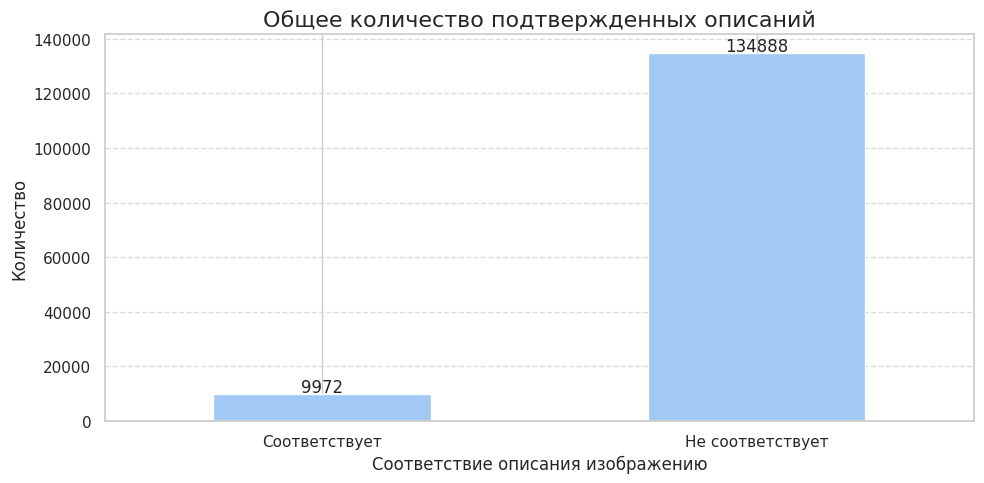

In [ ]:
# распределение подтвержденных/отклоненных описаний краудсорсинга
plt.figure(figsize=(10, 5))
ax = crowd_annot[['num_confirmed', 'num_rejected']].sum().plot(kind='bar')

# Устанавливаем правильные названия для столбцов
ax.set_xticklabels(['Соответствует', 'Не соответствует'], rotation=0)

plt.title('Общее количество подтвержденных описаний')
plt.ylabel('Количество')
plt.xlabel('Соответствие описания изображению')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Добавляем значения поверх столбцов
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 5),
                textcoords='offset points')

plt.tight_layout()
plt.show()



Здесь мы также можем наблюдать, что большинство изображений не соответсвуют данным, что не удивительно: описание может быть длинным и подробным, а вариантов ответа у оценщиков с краудсорса только два. И, если эксперт может выделить промежуточное состояние по совпадении некоторых деталей, оценщик скорее всего отклонит, как несоответствующее. Поэтому для дальнейшей работы мы будем использовать лишь оценки экспертов.



#### **Выводы**

- Мы загрузили и изучили датасеты с оценками соответствия.
- У датасета с экспертными оценками:
  - Типы данных соответствуют содержимому, пропусков и дубликатов не обнаружено.
  - Количество строк совпадает с таковым у тренировочных данных, и в видимой части также используются описания под номером 2.
  - При этом мы также наблюдаем, что как минимум для первого изображения доступно целых 7 описаний.
  - Количество уникальных изучаемых изображений и количество описаний совпадает с таковыми для тренировочных данных.
  - Каждый из экспертов выставлял разные оценки, при этом самым строгим оказался эксперт под номером 1, самый лояльным к несоотвествиям - под номером 3.
  - По мнению экспертов большинство изображений не соответствует описанию.
- У датасета с краундсорсинговыми оценками:
  - Данных больше, чем у экспертных (оценено большее количество пар "изображение-описание"), при этом одно и то же изображение может иметь даже 15 описаний.
  - При этом качество разметки ниже (не промежуточных вариантов соответствия).
  - По мнению оценщиков с краундсорса большинство изображений также не сответствует описанию, что совпадает с мнением экспертов.
- Для дальнейшей работы будем использовать только мнение экспертов как более качественное с точки зрения разметки данных.

### **Изучаемые изображения**

Теперь посмотрим на сами изображения.

In [ ]:
# загрузка тестовых изображений
# с выводом типа ошибки
try:
    test_images = pd.read_csv(os.path.join(PATH, 'test_images.csv'),
                            sep='|') # разделитель
    print(color.BLUE + color.BOLD + f"Тестовые изображения успешно загружены!" + color.END)
except Exception as e:
    print(color.BLUE + color.BOLD + f"Ошибка: "+ color.END + f"{e}")

Тестовые изображения успешно загружены!


In [ ]:
# Вызов функции discr_num и ее вывод
first_discr(test_images,'test_images', 10)


 === Первые 10 строк в test_images: ===



,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg
5,424307754_1e2f44d265.jpg
6,3044359043_627488ddf0.jpg
7,3396275223_ee080df8b5.jpg
8,2977379863_2e8d7a104e.jpg
9,634891010_9fa189effb.jpg



 === Общая информация о данных в test_images: ===

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes


None


 === Размер датасета test_images:===
    (100, 1)


 === Явные дубликаты в test_images:===
Количество: 0
Процент: 0.00 %


Тут мы также имеем 100 изображений для теста. Дубликаты отсутствуют.

Посмотрим также на примеры изображений в тестовой и тренировочных выборках.

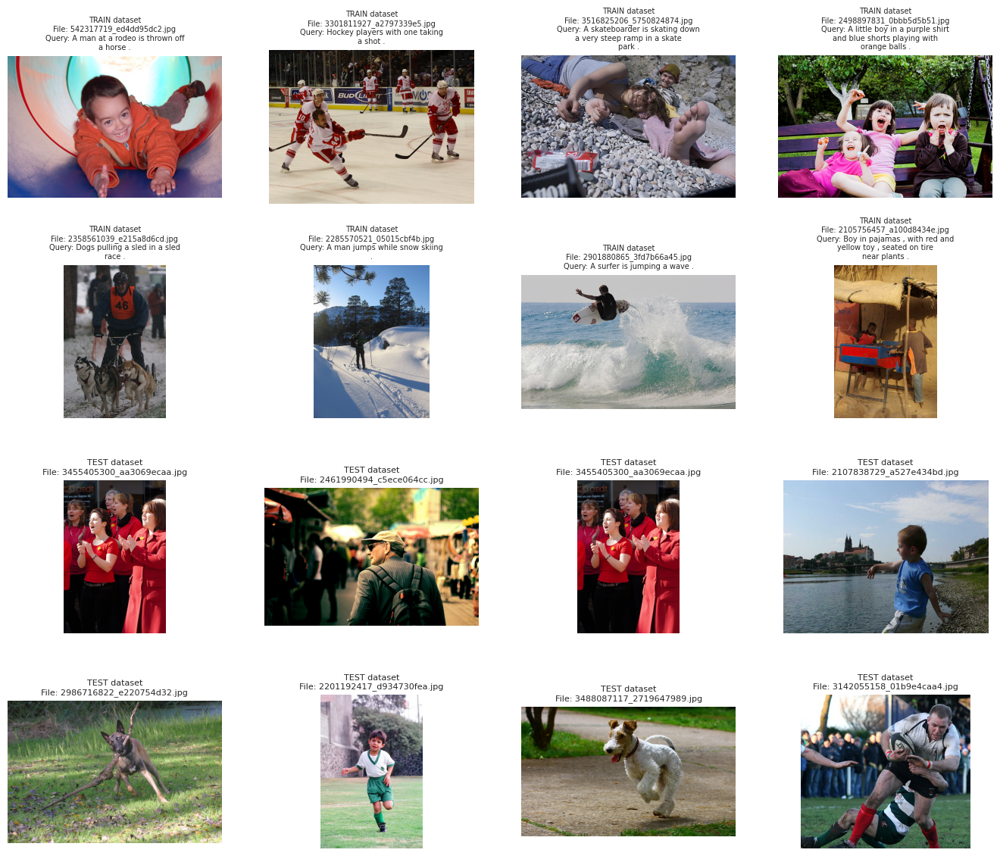

In [ ]:
# вывод примеров изображений из тестовой и тренировочной выборки
# с выводом принадлежности к датасету, именем изображения (файла) и описанием (для тренировочного)
# Выбор примеров с сохранением нужных данных
samples_train = train_dataset[['image', 'query_text']].sample(8)
samples_test = test_queries[['image']].sample(8)

# Создание фигуры с увеличенной высотой
fig = plt.figure(figsize=(14, 12))

# Функция для обработки текста запроса
def format_query_text(text, max_line_length=30):
    if pd.isna(text):
        return ""
    words = str(text).split()
    lines = []
    current_line = ""

    for word in words:
        if len(current_line) + len(word) + 1 <= max_line_length:
            current_line += (" " + word if current_line else word)
        else:
            lines.append(current_line)
            current_line = word
    if current_line:
        lines.append(current_line)

    return "\n".join(lines)

# Отображение тренировочных изображений (первые 8)
for i in range(8):
    ax = fig.add_subplot(4, 4, i+1)
    try:
        img_path = os.path.join(PATH, 'train_images', samples_train.iloc[i]['image'])
        image = Image.open(img_path).convert('RGB')
        ax.imshow(image)

        # Формируем многострочную подпись
        filename = samples_train.iloc[i]['image']
        query_text = format_query_text(samples_train.iloc[i]['query_text'])

        label = f"TRAIN dataset\nFile: {filename}\nQuery: {query_text}"
        ax.set_title(label, fontsize=7, pad=6)

    except Exception as e:
        print(f"Ошибка загрузки {samples_train.iloc[i]['image']}: {e}")
        ax.text(0.5, 0.5, 'Not found', ha='center', va='center')
        ax.set_title(f"TRAIN dataset\nError loading\n{samples_train.iloc[i]['image']}",
                    fontsize=7, color='red')
    ax.axis('off')

# Отображение тестовых изображений (последние 8)
for i in range(8):
    ax = fig.add_subplot(4, 4, i+9)
    try:
        img_path = os.path.join(PATH, 'test_images', samples_test.iloc[i]['image'])
        image = Image.open(img_path).convert('RGB')
        ax.imshow(image)

        # Подпись для тестовых изображений
        filename = samples_test.iloc[i]['image']
        ax.set_title(f"TEST dataset\nFile: {filename}", fontsize=8, pad=6)

    except Exception as e:
        print(f"Ошибка загрузки {samples_test.iloc[i]['image']}: {e}")
        ax.text(0.5, 0.5, 'Not found', ha='center', va='center')
        ax.set_title(f"TEST dataset\nError loading\n{samples_test.iloc[i]['image']}",
                    fontsize=7, color='red')
    ax.axis('off')

plt.tight_layout(pad=3.0)
plt.subplots_adjust(top=0.92, hspace=0.4, wspace=0.2)
plt.show()

Мы можем наблюдать, что изображения имеют разную тематику. Но некоторые из изображений в обоих выборках попадают под действие юридических ограничений. Поэтому пред обучением модели нам будет необходимо избавиться от таких изображений в тренировочной выборке.

Выводимые описания в разной степени соответствуют либо не соответствуют описываемому. Дополнительно (с выводом оценки соответствия) мы посмотрим на тренировочные изображения уже позже, после очистки от запрещенного контента.

#### **Выводы**

- Мы загрузили и изучили тестовые изображения, их количество совпадает с таковым у тестовых данных.
- Также вывели примеры изображений из тестовых и тренировочных данных:
  - Фотографии имеют различную тематику.
  - Некоторые изображения в обеих выборках попадают под юридические ограничения.

### **Агрегация**


Для оценки соответсвия было решено оставить лишь мнение экспертов, так как они постоянны (у нас их всего три), как они имеют более глубокие познания, а также несколько вариантов (четыре) для оценки соответствия.

Знания и опыт учатников краундсорсинга (которых может быть потенциально разное количество и/или это могло быть много разных людей) нам еизвестны, к тому же они ограничены в выборе ответов (всего два).

Например, если на фото будет изображено "три рыжие собаки, бегущие за желтым мячом по траве", а описание будет гласить "черная собака плавает в бассейне", то краундсорсер отклонит картинку, как несоответсвующую, а эксперт же сможет выставить оценку 2, так как собака на фото все-таки присутсвует.

Имено поэтому, ввиду низкого качества разметки от краундсорса, мы и будем использовать только оценки эксперта. Пусть мы и потеряем в количестве данных, но разметка у них будет более качественная, и модель сможет научиться находить находить хотя бы собак (у краунсорсеров она скорее всего не научится ничему).

Так как модель оценивает вероятность, то оценки экспертов необходимо привести к диапазону от 0 до 1.

Создадим новый столбец с названием 'expert_score' где нормализуем оценки экспертов, а также будем учитывать консенсус экспертов, используя моду в случае когда эксперты назначили одинаковые оценки

In [ ]:
# функция для "итоговой" экспертная оценка
def normalize_scores(row):
    scores = [row['first_exp'], row['second_exp'], row['third_exp']]
    # выбор моды, если есть совпадения
    if len(set(scores)) < 3:
        final_score = max(set(scores), key=scores.count)
    else:
        final_score = np.mean(scores)
    # нормализация
    return (final_score - 1) / 3 # "размах" межу максимальной и минимальной оценками

In [ ]:
# получение оценки
exp_annot['expert_score'] = exp_annot.apply(normalize_scores, axis=1)
exp_annot.head() # проверка

,image,query_id,first_exp,second_exp,third_exp,expert_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.00
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.00
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.00
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.33
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.00


In [ ]:
# статичтическое описание
exp_annot['expert_score'].describe()

,expert_score
count,"5,822.00"
mean,0.21
std,0.29
min,0.00
25%,0.00
50%,0.00
75%,0.33
max,1.00


Оценки агрегированы и нормализованы. И среди изображений среди них встречаются как полностью несоответсвующие, так и полностью соответсвующие описанию изобращения согласно итоговой оценке, при этом несоответсвующих большинство, о и имеющих соотвествие, хотя бы небольшое, немало. Так что можно считать, что преобразование оценок прошло успешно.

Теперь можно присоединить их к тренировочным данным. Объединять мы будем по парам "image"+"query_id".

In [ ]:
# объединим наши данные
full_train = pd.merge(train_dataset, exp_annot[['image', 'query_id', 'expert_score']],
                            how='outer', on=['image', 'query_id'])

In [ ]:
# Вызов функции discr_num и ее вывод
first_discr(full_train,'full_train', 15)


 === Первые 15 строк в full_train: ===



,image,query_id,query_text,expert_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,0.00
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses smiles .,0.00
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.00
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empty square .,0.33
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,0.00
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,A soccer ball is above the head of a man wearing black shorts and red and black striped shirt .,0.00
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,A young boy dressed in a red uniform kicks the soccer ball on the field as another child in blue watches from behind .,0.00
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,A man and woman look back at the camera while standing in front of a red art structure .,0.00
8,106490881_5a2dd9b7bd.jpg,1425069308_488e5fcf9d.jpg#2,A white dog jumps to catch a blue ball in a living room .,0.00
9,106490881_5a2dd9b7bd.jpg,1714316707_8bbaa2a2ba.jpg#2,A little boy shakes the snow off of a tree .,0.33



 === Общая информация о данных в full_train: ===

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   image         5822 non-null   object 
 1   query_id      5822 non-null   object 
 2   query_text    5822 non-null   object 
 3   expert_score  5822 non-null   float64
dtypes: float64(1), object(3)
memory usage: 182.1+ KB


None


 === Размер датасета full_train:===
    (5822, 4)


 === Явные дубликаты в full_train:===
Количество: 0
Процент: 0.00 %


Данные успешно объеденены. В будущем мы удалим столбец 'query_id', но он нам пригодится еще для фильтрации контента. Поэтому пока выведем примеры тренировочных изображений, уже не только с описанием, но и с итоговой оценкой экспертов.

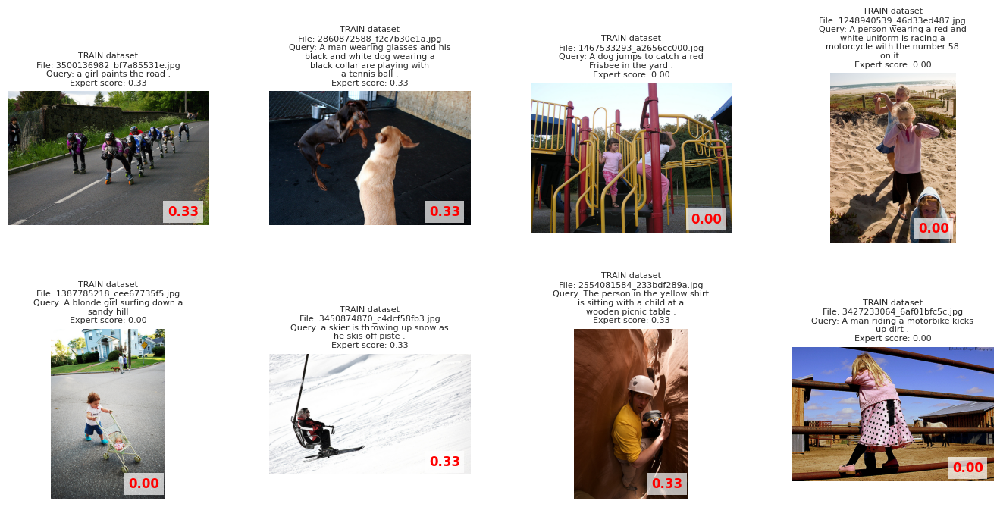

In [ ]:
# вывод тренирвочных данных с оценкой
# функция format_query_text() была создана ранее, в предыдущем выводе
# выбор примеров с сохранением нужных данных
samples_train = full_train[['image', 'query_text', 'expert_score']].sample(8)

# создание фигуры с увеличенной высотой
fig = plt.figure(figsize=(14, 14))

# отображение тренировочных изображений
for i in range(8):
    ax = fig.add_subplot(4, 4, i+1)
    try:
        img_path = os.path.join(PATH, 'train_images', samples_train.iloc[i]['image'])
        image = Image.open(img_path).convert('RGB')
        ax.imshow(image)

        # формируем многострочную подпись
        filename = samples_train.iloc[i]['image']
        query_text = format_query_text(samples_train.iloc[i]['query_text'])
        score = samples_train.iloc[i]['expert_score']

        # цвет оценки для диапазона 0-1
        score_color = 'green' if score >= 0.7 else 'orange' if score >= 0.4 else 'red'

        label = (f"TRAIN dataset\n"
                f"File: {filename}\n"
                f"Query: {query_text}\n"
                f"Expert score: {score:.2f}")  # Округляем до 2 знаков

        ax.set_title(label, fontsize=8, pad=6)

        # отображаем оценку в углу изображения
        ax.text(0.95, 0.05, f"{score:.2f}",
                transform=ax.transAxes,
                color=score_color,
                fontsize=12,
                fontweight='bold',
                ha='right', va='bottom',
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

    except Exception as e:
        print(f"Ошибка загрузки {samples_train.iloc[i]['image']}: {e}")
        ax.text(0.5, 0.5, 'Not found', ha='center', va='center')
        ax.set_title(f"TRAIN dataset\nError loading\n{samples_train.iloc[i]['image']}",
                    fontsize=7, color='red')
    ax.axis('off')

plt.tight_layout(pad=3.0)
plt.subplots_adjust(top=0.92, hspace=0.5, wspace=0.3)
plt.show()

Полностью не соответствующие описанию изображения ожидаемо не соответствуют изображению полностью. Имеющие небольшое соответсвие имеют один совпадающий элемент из описания. А вот некоторые изображения получили не слишком высокий балл несмотря на высокое визуальное сходство между изображением и описанием: вероятно, эксперты не пришли к консенсусу со степенью соответствия.

Так как мы не обладаем знаниями экспертов, согласимся с их оценками. И примем, что объединие датасетов прошло успешно.

#### **Выводы**

- Для обучения модели мы выбрали оценки экспертов как более высокачественные.
- Агрегировали и нормализовали оценки экспертов в одну итоговую.
- Создали новый объединенный датасет с тренировочными данными и итоговыми оценками экпертов.
- Визуально оценили соответвие опианий и полученных финальных оценок:
  - Полностью не соответствующие описанию изображения ожидаемо не соответствуют изображению полностью.
  - Имеющие небольшое соответствие в основном имеют один совпадающий элемент из описания.
  - Некоторые изображения получили не слишком высокий балл несмотря на высокое визуальное сходство между изображением и описанием: вероятно, эксперты не пришли к консенсусу со степенью соответствия.

### **Выводы**

- Мы загрузили данные и предварительно изучили их.
- Для дальнейшей работы мы создали новый датасет на основе датасета с тренировочными данными и итоговыми оценками экспертов.

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Как мы могли некоторые из изображений в обоих выборках попадают под действие юридических ограничений. Поэтому пред обучением модели нам будет необходимо избавиться от таких изображений в тренировочной выборке (что можно сделать автоматически). А вот избавиться от таких изображений в тестовых данных ("скрыть их") возможно в нашем случае лишь в ручном режиме, просмотрев всю сотню изображений. Так как для сайта для скрытия такого контента для поиска в принципе (чтобы он случайно не продемонстрировался в процессе поиска другого изображения) необходимо же будет провести дополнительную маркировку контента, чтобы такие изображения в принципе не попадали в зону поиска модели.

Так как как наша модель - тестовая, то очищать будем лишь тренировочные данные.

Избавиться мы должны от изображений, которому принадлежат описания со стоп-словами (список которых мы обозначили в начале проекта).

Получим список таких изображений, но перед этим приведем тест в описаниях в нижний регистр.

In [ ]:
# приводим к нижнему регистру
train_dataset['query_text'] = train_dataset['query_text'].str.lower()
train_dataset.head() # проверка

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitting in a float in a pool .
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitting in a float in a pool .
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitting in a float in a pool .
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitting in a float in a pool .
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitting in a float in a pool .


In [ ]:
# Функция для проверки наличия стоп-слов в тексте
def contains_forbidden_words(text):
    text_lower = text.lower()
    return any(word in text_lower for word in WORD_TO_BLOCK)

# Применяем функцию к query_text и фильтруем строки
forbidden_df = full_train[full_train["query_text"].apply(contains_forbidden_words)]

# Извлекаем query_id и убираем часть после #
forbidden_images = forbidden_df["query_id"].str.split("#").str[0].unique()

# Результат — список изображений, в описаниях которых есть стоп-слова
print(color.BLUE + color.BOLD + f"Количество запрещенных изображений: " + color.END + f"{len(forbidden_images.tolist())}")
print(color.BLUE + color.BOLD + f"Список изображений с запрещенным контентом:" + color.END)
print(forbidden_images.tolist())


Количество запрещенных изображений: 294
Список изображений с запрещенным контентом:
['2549968784_39bfbe44f9.jpg', '2718495608_d8533e3ac5.jpg', '3545652636_0746537307.jpg', '1714316707_8bbaa2a2ba.jpg', '2140182410_8e2a06fbda.jpg', '2479652566_8f9fac8af5.jpg', '1287475186_2dee85f1a5.jpg', '2358554995_54ed3baa83.jpg', '2544426580_317b1f1f73.jpg', '191003285_edd8d0cf58.jpg', '2370481277_a3085614c9.jpg', '2577972703_a22c5f2a87.jpg', '3388330419_85d72f7cda.jpg', '2274992140_bb9e868bb8.jpg', '2445283938_ff477c7952.jpg', '2510020918_b2ca0fb2aa.jpg', '3325497914_f9014d615b.jpg', '3549583146_3e8bb2f7e9.jpg', '1131932671_c8d17751b3.jpg', '3245460937_2710a82709.jpg', '3516825206_5750824874.jpg', '3239021459_a6b71bb400.jpg', '3459156091_c1879ebe28.jpg', '1237985362_dbafc59280.jpg', '2594042571_2e4666507e.jpg', '533713007_bf9f3e25b4.jpg', '543007912_23fc735b99.jpg', '2295750198_6d152d7ceb.jpg', '3185409663_95f6b958d8.jpg', '2228022180_9597b2a458.jpg', '3243588540_b418ac7eda.jpg', '3280052365_c4644bf

Просмотрим эти запрещенные изображения.

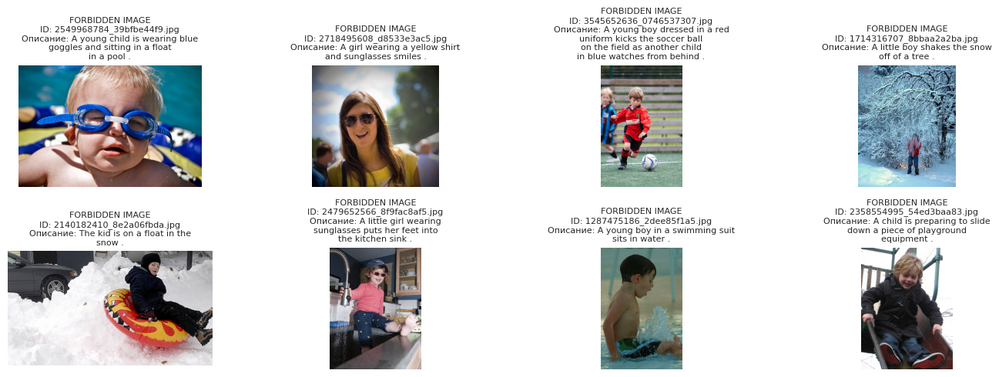

In [ ]:
# выводим уникальные изображения (из столбца query_id)
# с подписями

# извлекаем уникальные изображения (без части после #)
# было
#unique_forbidden_images = forbidden_df['query_id'].str.split('#').str[0].unique()
# стало; по сути теперь это строка лишняя, можно сразу использовать ранее полученную переменную
unique_forbidden_images = forbidden_images
# выбираем первые 8 уникальных изображений для отображения
samples_to_show = min(8, len(unique_forbidden_images))
samples_forbidden = forbidden_df.drop_duplicates(subset=['query_id']).head(samples_to_show)

# создание фигуры
fig = plt.figure(figsize=(14, 10))

# отображение запрещенных изображений
for i in range(samples_to_show):
    ax = fig.add_subplot(4, 4, i+1)
    try:
        # получаем имя файла (без #части)
        img_filename = samples_forbidden.iloc[i]['query_id'].split('#')[0]
        img_path = os.path.join(PATH, 'train_images', img_filename)

        # загружаем и отображаем изображение
        image = Image.open(img_path).convert('RGB')
        ax.imshow(image)

        # получаем описание
        query_text = format_query_text(samples_forbidden.iloc[i]['query_text'])

        # формируем подпись
        label = (f"FORBIDDEN IMAGE\n"
                f"ID: {img_filename}\n"
                f"Описание: {query_text}")

        ax.set_title(label, fontsize=8, pad=6)

    except Exception as e:
        img_filename = samples_forbidden.iloc[i]['query_id'].split('#')[0]
        print(f"Ошибка загрузки {img_filename}: {e}")
        ax.text(0.5, 0.5, 'Не найдено', ha='center', va='center')
        ax.set_title(f"FORBIDDEN\nОшибка загрузки\n{img_filename}",
                    fontsize=7, color='red')
    ax.axis('off')

# если найдено меньше 8 изображений, очищаем оставшиеся subplots
for i in range(samples_to_show, 8):
    fig.delaxes(fig.get_axes()[i])

plt.tight_layout(pad=3.0)
plt.subplots_adjust(top=0.92, hspace=0.5, wspace=0.3)
plt.show()

Данные изображения в большинстве своем соответствуют запрещенному контенту, однако ввиду наличия нескольких значений у некоторых слов (girl - может быть как девочка, так и девушка) отфильтровалось контента больше, чем могло бы.

Доверимся получившимуся фильтру и не будем дополнительно чистить вручную, чтобы оставить лишь полностью подходящий контент.

Очистим датасет от запрещенных изображений.

In [ ]:
# создаем очищенный датасет
# было
#clean_df = full_train[~full_train["query_text"].apply(contains_forbidden_words)]
# стало
clean_df = full_train[~full_train['image'].isin(forbidden_images)].copy()
# Вызов функции discr_num и ее вывод
first_discr(clean_df,'clean_df', 10)


 === Первые 10 строк в clean_df: ===



,image,query_id,query_text,expert_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,0.00
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses smiles .,0.00
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.00
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empty square .,0.33
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,0.00
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,A soccer ball is above the head of a man wearing black shorts and red and black striped shirt .,0.00
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,A young boy dressed in a red uniform kicks the soccer ball on the field as another child in blue watches from behind .,0.00
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,A man and woman look back at the camera while standing in front of a red art structure .,0.00
16,1082379191_ec1e53f996.jpg,1287475186_2dee85f1a5.jpg#2,A young boy in a swimming suit sits in water .,0.00
17,1082379191_ec1e53f996.jpg,1536774449_e16b1b6382.jpg#2,A crowd of people at an outdoor event,0.33



 === Общая информация о данных в clean_df: ===

<class 'pandas.core.frame.DataFrame'>
Index: 4066 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   image         4066 non-null   object 
 1   query_id      4066 non-null   object 
 2   query_text    4066 non-null   object 
 3   expert_score  4066 non-null   float64
dtypes: float64(1), object(3)
memory usage: 158.8+ KB


None


 === Размер датасета clean_df:===
    (4066, 4)


 === Явные дубликаты в clean_df:===
Количество: 0
Процент: 0.00 %


In [ ]:
print(color.BLUE + color.BOLD + f"Количество оставшихся уникальных тренировочных изображений: " + color.END + f"{clean_df['image'].nunique()}")
print(color.BLUE + color.BOLD + f"Количество оставшихся уникальных тренировочных описаний: " + color.END + f"{clean_df['query_text'].nunique()}")

Количество оставшихся уникальных тренировочных изображений: 706
Количество оставшихся уникальных тренировочных описаний: 941


Несмотря на то, что запрещенных изображений около трех сотен, наш датасет потерял более чем полторы тысячи строк. Зато оставшиеся данные с большой долей вероятности не должны содержать запрещенного контента.

При этом количество самих уникальных изображений с запрещенным контентом сократилось почти на две сотни вместо почти трех - то есть не все изображения, на которых мы нашли запрещенный контент согласно их описанию, попали в тренировочный датасет.

Выведем образцы изображений из датасета.

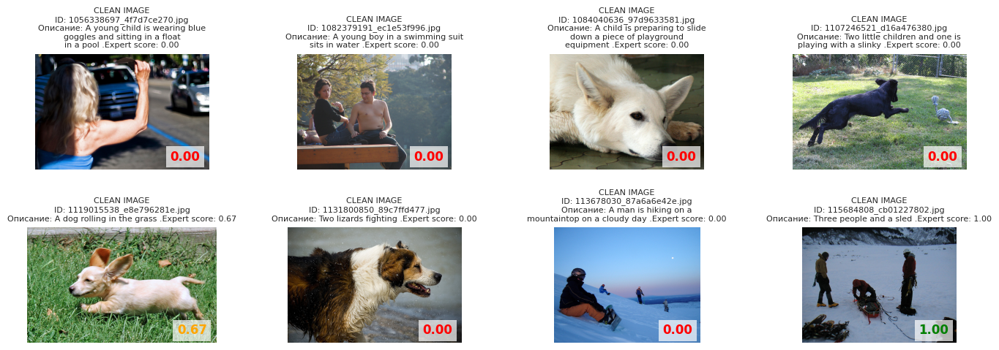

In [ ]:
# выводим уникальные изображения (из столбца image)
# с подписями и выводом оценки соответствия

# извлекаем уникальные изображения (без части после #)
# было
# unique_clean_images = clean_df['query_id'].str.split('#').str[0].unique()

# стало
unique_clean_images = clean_df['image'].str[0].unique()

# выбираем первые 8 уникальных изображений для отображения
samples_to_show = min(8, len(unique_clean_images))
# было
# samples_clean = clean_df.drop_duplicates(subset=['query_id']).head(samples_to_show)
# стало
samples_clean = clean_df.drop_duplicates(subset=['image']).head(samples_to_show)

# создание фигуры
fig = plt.figure(figsize=(14, 10))

# отображение запрещенных изображений
for i in range(samples_to_show):
    ax = fig.add_subplot(4, 4, i+1)
    try:
        # получаем имя файла (без #части)
        # было
        #img_filename = samples_clean.iloc[i]['query_id'].split('#')[0]
        # стало
        img_filename = samples_clean.iloc[i]['image']
        img_path = os.path.join(PATH, 'train_images', img_filename)

        # загружаем и отображаем изображение
        image = Image.open(img_path).convert('RGB')
        ax.imshow(image)

        # получаем описание
        query_text = format_query_text(samples_clean.iloc[i]['query_text'])

        # получаем оценку - добавлено
        score = samples_clean.iloc[i]['expert_score']

        # цвет оценки для диапазона 0-1 - добавлено
        score_color = 'green' if score >= 0.7 else 'orange' if score >= 0.4 else 'red'

        # формируем подпись
        label = (f"CLEAN IMAGE\n"
                f"ID: {img_filename}\n"
                f"Описание: {query_text}"
                f"Expert score: {score:.2f}")  # - добавлено

        ax.set_title(label, fontsize=8, pad=6)

        # отображаем оценку в углу изображения - добавлено
        ax.text(0.95, 0.05, f"{score:.2f}",
                transform=ax.transAxes,
                color=score_color,
                fontsize=12,
                fontweight='bold',
                ha='right', va='bottom',
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

    except Exception as e:
        # было
        # img_filename = samples_clean.iloc[i]['query_id'].split('#')[0]
        # стало
        img_filename = samples_clean.iloc[i]['image']
        print(f"Ошибка загрузки {img_filename}: {e}")
        ax.text(0.5, 0.5, 'Не найдено', ha='center', va='center')
        ax.set_title(f"CLEAN\nОшибка загрузки\n{img_filename}",
                    fontsize=7, color='red')
    ax.axis('off')

# если найдено меньше 8 изображений, очищаем оставшиеся subplots
for i in range(samples_to_show, 8):
    fig.delaxes(fig.get_axes()[i])

plt.tight_layout(pad=3.0)
plt.subplots_adjust(top=0.92, hspace=0.5, wspace=0.3)
plt.show()

На выведенных образцах запрещенный контент не обнаружен. Однако подписи содержат указание на запрещенный контент. При этом мы можем наблюдать низкую оценку соответсвия между такими описаниями и изображениям, к которому оно "примеряется."

Очистку тестовых данных от запрещенного контента мы производить не будем, так как они являются имитацей неизвестных модели данных и позволяют оценить визуально качество нашей модели. На практике же такие изображения (с запрещнным контентом) требуют дополнительную маркировку, чтобы в принципе блокироваться к отображению в некоторых странах независимо от запроса.

### **Выводы**
- Мы исключили из тренировочного датсета изображения с запрещенным контентом, что привело к уменьшению доступных для обучения данных.
- При этом количество самих уникальных изображений с запрещенным контентом в очищенном датасете сократилось на меньшее число, чем было найдено изображений с запрещенным контентом - то есть не все эти изображения попали в тренировочный датасет.
- Описания, содержащие указания на запрещеннй контент при этом сохранились. При этом мы можем наблюдать низкую оценку соответсвие между такими описаниями и изображениям, к которому оно "примеряется.
- Фильтрация тестовых данных не производилась.

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

Начнем с подготовки модели.

In [ ]:
resnet = models.resnet18(pretrained=True) # загружаем претренированную модель

# замораживаем веса, так как нам не потребуется обучать модель
for param in resnet.parameters():
    param.requires_grad_(False)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


После заморозки весов надо определиться, все ли слои можно использовать для получения эмбеддингов. На практике используются только свёрточные слои. Для получения списка слоёв применим метод children():

In [ ]:
print(list(resnet.children()))  # смотрим список слоев

[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU(inplace=True), MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False), Sequential(
  (0): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (1): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bia

Возьмем все слои, кроме последнего (отвечающего за классификацию)

In [ ]:
modules = list(resnet.children())[:-1] # исключаем последний модуль
resnet = nn.Sequential(*modules) # обновляем стуктуру модели

In [ ]:
resnet.eval() # переводим в режим предсказания

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Con

Приведем изображения в нужный формат. Для этого изменим размер картинки, вырежем центр и нормализуем.

In [ ]:
# поготовка к подготовке изображений

norm = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                            std=[0.229, 0.224, 0.225])

preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    norm,
])

In [ ]:
def get_features_img(vecs, idx):
    """создает DataFrame из векторов признаков."""
    features_img = pd.DataFrame(
        index=idx, data=np.array(vecs),
        columns=[f'{i}_img' for i in range(len(vecs[0]))]
    )
    return features_img


def img_to_vec(data=clean_df, img_dir='train_images',
               base_dir=PATH):
    """основная функция обработки изображений."""
    img_dir_path = os.path.relpath(
        os.path.join(base_dir, img_dir)
    )
    unique_images = data['image'].unique()

    vectors = []
    for img_name in tqdm(unique_images):
        img_path = \
            os.path.relpath(os.path.join(img_dir_path, img_name))
        img = Image.open(img_path).convert('RGB')
        image_tensor = preprocess(img).unsqueeze(0).to(device)
        output_tensor = resnet(image_tensor).flatten().to('cpu')
        vectors.append(output_tensor.numpy())
    return get_features_img(vectors, unique_images)

In [ ]:
features_img = img_to_vec() # преобразование
# размерность
# количество обработанных изображений,
# размерность вектора признаков каждого изображения
print(color.BLUE + color.BOLD + f"Размерность: " + color.END + f"{features_img.shape}")

  0%|          | 0/706 [00:00<?, ?it/s]

Размерность: (706, 512)


Количество обработанных изображений совпадает с количеством уникальных изображений в очищенном тренировочном датасете.

### **Вывод**

Тренировочные изображения успешно преобразованы.

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Можно поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- трансформеры (например Bert)


Так как у нас не так много слов используется в описаниях, для векторизации текстов воспользуемся моделью BERT. Также практичнее будет использовать предобученную модель.

In [ ]:
model_path = 'bert-base-uncased' # выбор предобученной модели
# загружаеv архитектуру модели и её веса и помещаем на девайс
model = AutoModel.from_pretrained(model_path).to(device)
# токенизатор
tokenizer = AutoTokenizer.from_pretrained(model_path)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [ ]:
# задаем размер батча
batch_size = 100

In [ ]:
# создаем пользовательский класс
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, data, attention_mask):
        self.data = data
        self.attention_mask = attention_mask

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx], self.attention_mask[idx]

In [ ]:
# функция для обработки батчей текстовых данных с помощью предобученной BERT-модели
def process_batch(batch):
    """
    Принимает батч данных (токены + маски внимания).
    Переносит тензоры на выбранное устройство (cuda или cpu).
    Пропускает через BERT-модель:
        batch: тензор input_ids формы (batch_size, seq_length).
        attention_mask: указывает модели, какие токены игнорировать (например, паддинг).
    Извлекает эмбеддинги [CLS]-токена (первого токена в последовательности):
        batch_embeddings[0] — скрытые состояния формы (batch_size, seq_length, hidden_dim=768).
        [:, 0, :] — берём только первый вектор ([CLS]) для каждого примера в батче.
    Возвращает numpy-массив на CPU формы (batch_size, 768)
    Форма 768 в BERT (bert-base-uncased и других base-моделях)
    — это размерность скрытого состояния (hidden dimension) для каждого токена.
    """
    batch, attention_mask_batch = batch # распаковка батча
    batch = batch.to(device) # перенос на GPU (если доступен)
    attention_mask_batch = attention_mask_batch.to(device)
    with torch.no_grad():
        batch_embeddings = model(batch, attention_mask=attention_mask_batch) # отключаем вычисление градиентов (только инференс)
    return batch_embeddings[0][:, 0, :].cpu().numpy()

In [ ]:
# так как у нас не очень длинные тексты, по-умолчанию укажем длину 50
# так мы получим ускорение заодно
def get_encoded_values(unique_texts, max_length=50):
    """
    Что делает:
        Вход: Принимает тексты (unique_texts). Если передан DataFrame, извлекает уникальные значения из столбца query_text.
              max_length - до какого размера обрезать тексты, со значением по-умолчанию
        Токенизация:
            batch_encode_plus пакетно обрабатывает тексты.
            Параметры:
                max_length=max_length: обрезает тексты до указанного количества токенов.
                padding='max_length': дополняет короткие тексты до указанного количества токенов.
                return_attention_mask=True: возвращает маску внимания (игнорирует паддинг).
            Возвращает:
                input_ids (токены в виде чисел),
                attention_mask (маску),
                исходные тексты (unique_texts).
    """
    if len(unique_texts) > 1:
        unique_texts = unique_texts['query_text'].unique().tolist()

    encoded = tokenizer.batch_encode_plus(
        unique_texts,
        add_special_tokens=True,
        return_attention_mask=True,
        padding='max_length',
        truncation=True,
        return_token_type_ids=False,
        max_length=max_length, # лучше делать переменной
        return_tensors='pt'
    )
    return encoded.values(), unique_texts

# сборная функция
def txt_to_vec(data=clean_df, batch_size=batch_size):
    """
    Что происходит под капотом?
        Для каждого текста:
            Токенизация → добавление [CLS] и [SEP], обрезка/паддинг до 150 токенов.
            Пропуск через BERT → получение скрытых состояний.
            Извлечение эмбеддинга [CLS]-токена (вектор 768D).
        Итог: DataFrame, где каждая строка — векторное представление текста.
    """
    # получаем токенизированные данные и маски
    values = get_encoded_values(data)
    padded, attention_mask = values[0] # распаковка encoded значений
    unique_texts = values[1] # cписок текстов

    # cоздаем Dataset и DataLoader для обработки батчами
    dataset = CustomDataset(padded, attention_mask)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

    # обрабатывает батчи через process_batch (получает эмбеддинги [CLS]-токена)
    # объединяет результаты в один массив vectors_txt формы (n_texts, 768)
    if len(unique_texts) > 1:
        dataloader = tqdm(dataloader)
    embeddings = [process_batch(batch) for batch in dataloader]
    vectors_txt = np.concatenate(embeddings)

    # cоздаем DataFrame, где:
    # cтроки: исходные тексты (unique_texts).
    # cтолбцы: 768 признаков (эмбеддинги BERT) с префиксом _txt.
    features_txt = pd.DataFrame(
        index=unique_texts, data=np.array(vectors_txt),
        columns=[f'{i}_txt' for i in range(len(vectors_txt[0]))]
    )
    return features_txt

In [ ]:
features_txt = txt_to_vec() # преобразование
# проверка
# количество текстовых примеров (строк) в вашем датасете,
# размерность векторного представления каждого текста (эмбеддинга), так как BERT, то равен 768
print(color.BLUE + color.BOLD + f"Размерность: " + color.END + f"{features_txt.shape}")

  0%|          | 0/10 [00:00<?, ?it/s]

Размерность: (941, 768)


Количество обработанных изображений текстов совпадает с количеством уникальных текстов в очищенном тренировочном датасете.

### **Вывод**

Тренировочные описания успешно преобразованы.

## 5. Объединение векторов

Подготовлю данные для обучения: объединю векторы изображений и векторы текстов с целевой переменной.

In [ ]:
# объединение векторов для датасета
# более простой вариант
#query_vector = np.concatenate([
#    features_img.loc[clean_df['image']].values,
#    features_txt.loc[clean_df['query_text']].values
#], axis=1)
#query_vector.shape # проверка

Объединим наши векторы.

In [ ]:
# проверяем размеры
num_images = features_img.shape[0]
num_texts = features_txt.shape[0]

# вывод размеров
print(color.BLUE + color.BOLD + f"Размер векторов изображений: "+ color.END + f"{num_images}")
print(color.BLUE + color.BOLD + f"Размер векторов текстов: "+ color.END + f"{num_texts}")

Размер векторов изображений: 706
Размер векторов текстов: 941


Количество доступных векторов текстов и изображений совпадает с количеством уникальных таковых у очищегго датасета с тренировочными данными.

In [ ]:
# извлекаем векторы в порядке строк clean_df
repeated_image_vectors = features_img.loc[clean_df['image']].values

# проверяем размерность
print(color.BLUE + color.BOLD + f"Размерность векторов изображений:"+ color.END + f"{repeated_image_vectors.shape}")
# (n_rows_in_clean_df, 512)

Размерность векторов изображений:(4066, 512)


Количество строк с изображениями совпадает с количеством строк очищенного датасета с тренировочными данными.

In [ ]:
# преобразуем DataFrame с текстовыми векторами в словарь
text_to_vector = {text: row.values for text, row in features_txt.iterrows()}

# получаем векторы в порядке df_train_clean['query_text']
repeated_text_vectors = np.array([text_to_vector[text] for text in clean_df['query_text']])

print(color.BLUE + color.BOLD + f"Размер повторённых текстовых векторов:"+ color.END + f"{repeated_text_vectors.shape}")

Размер повторённых текстовых векторов:(4066, 768)


Количество строк с описаниями совпадает с количеством строк очищенного датасета с тренировочными данными.

In [ ]:
# объединяем
X = np.concatenate((repeated_image_vectors, repeated_text_vectors), axis=1)
print(color.BLUE + color.BOLD + f"Признаки: "+ color.END + f"{X.shape}")
pd.DataFrame(X).head()

Признаки: (4066, 1280)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

Количество строк нового тренировочного датсета совпадает с количеством очищенного тренировочного датасета. Размерность векторов совпадает с суммой размеров веторов изображения и текста.

In [ ]:
# проверка целевого
y = np.array(clean_df['expert_score'])
print(color.BLUE + color.BOLD + f"Целевой признак"+ color.END + f"{y.shape}")

Целевой признак(4066,)


Количество строк у целевого признака совпадает с таковым у нового датасета.

### **Вывод**
Объединение признаков прошло успешно.

## 6. Обучение модели предсказания соответствия

Для обучения необходимо разделить датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать необходимо выбрать самостоятельно. Также предстоит выбрать метрику качества либо реализовать свою.

Разобъем датасет на тренировочную и валидационную выборки и масштабируем результат.

In [ ]:
# подготовка к разбиению
gss = GroupShuffleSplit(n_splits=1, train_size=TRAIN_SIZE, random_state=RANDOM_STATE)
train_indices, val_indices = next(gss.split(X=X, y=y, groups=clean_df['image']))

In [ ]:
# разделение данных
X_train_raw, X_val_raw = X[train_indices], X[val_indices]
y_train, y_val = y[train_indices], y[val_indices]

In [ ]:
# масштабирование упрощенное
#(без отдельного создания скалера, так как он нам отдельно больше не нужен будет)
scaler = StandardScaler().fit(X_train_raw) # создание и обучение scaler
X_train_scaled = scaler.transform(X_train_raw) # трансформация train
X_val_scaled = scaler.transform(X_val_raw) # трансформация train

Выберем метрику RMSE для оценки качества модели. Данная метрика показывает насколько сильно модель отклоняется от реальных данных и удобна к пониманию т.к. она имеет размерность, которая соответствует размерности исходных данных.



### **Модели без нейронной сети**

Сначала посмотрим, какую метрику нам даст Дамми-модель со стратегией с предсказаниями-медианой.

In [ ]:
# 1. Dummy Regressor
# создаем модель и задаем стратегию
dummy_model = DummyRegressor(strategy='mean')

# тренируем модель
dummy_model.fit(X_train_raw, y_train)

# предсказываем на валидационных
dummy_preds = dummy_model.predict(X_val_raw)

# вычисляем RMSE (квадратный корень из среднеквадратичной ошибки)
dummy_rmse = np.sqrt(mean_squared_error(y_val, dummy_preds))

# выводим RMSE
#print('RMSE DummyRegressor =', '{:.4f}'.format(dummy_rmse))
print(color.BLUE + color.BOLD + f"RMSE DummyRegressor = "+ color.END + f"{dummy_rmse:.4f}")

RMSE DummyRegressor = 0.2941


Теперь мы знаем, на что ориентировать и можем повторить для линейной регрессии.

In [ ]:
# 2. Создаем и обучаем линейную регрессию
lr_model = LinearRegression()
lr_model.fit(X_train_scaled, y_train)
# было
# lr_rmse = np.sqrt(mean_squared_error(y_val, lr_model.predict(X_val_raw)))
# стало
lr_rmse = np.sqrt(mean_squared_error(y_val, lr_model.predict(X_val_scaled)))

print(color.BLUE + color.BOLD + f"RMSE LinearRegression = "+ color.END + f"{lr_rmse:.4f}")

RMSE LinearRegression = 0.6631


Линейная регрессия показывает себя хуже, чем базовая модель.

In [ ]:
# 3. Decision Tree
dt_model = DecisionTreeRegressor(random_state=RANDOM_STATE)
# было
#dt_model.fit(X_train_raw, y_train)
#dt_rmse = np.sqrt(mean_squared_error(y_val, dt_model.predict(X_val_raw)))
# стало
dt_model.fit(X_train_scaled, y_train)
dt_rmse = np.sqrt(mean_squared_error(y_val, dt_model.predict(X_val_scaled)))
print(color.BLUE + color.BOLD + f"RMSE Decision Tree = "+ color.END + f"{dt_rmse:.4f}")

RMSE Decision Tree = 0.3656


Дерево показало себя лучше, чем линейная регрессия, но хуже, чем Дамми-модель.


#### **Выводы**
- Модель Дерева решений показало себя лучше модели Линейной регрессии.
- Обе модели (Линейной регрессии и Дерева решений) показали себя хуже Дамми-модели со стратегией заполнения медианой.

### **Нейронная сеть**

#### **v1**

Выполним реализацию нейронной сети с использованием библиотеки PyTorch с улучшенной архитектурой и механизмом ранней остановки.

- Преобразуем признаки и целевую переменную в формат тензоров PyTorch;
- Создадим загрузчик данных для обучения, используя весь датасет как один батч для более стабильного обучения;
- Определим класс Net, представляющий собой улучшенную нейронную сеть с:
  * Двумя скрытыми слоями с активацией Tanh
  * Пакетной нормализацией (BatchNorm) после каждого полносвязного слоя
  * Dropout-слоями с вероятностью 0.3 для регуляризации
  * Инициализацией весов по методу Kaiming (He-инициализация)
  * Последовательностью прямого прохода с учетом всех указанных слоев;
- Зададим параметры сети (количество нейронов во входном, скрытых и выходном слоях);
- Создадим экземпляр сети Net и настроим:
  * Оптимизатор Adam с уменьшенным learning rate (1e-5)
  * Функцию потерь MSELoss()
  * Механизм ранней остановки с параметрами:
    - patience=10 (эпох без улучшения)
    - min_delta=0.001 (минимальное значимое улучшение)
  * Логику сохранения и загрузки лучших весов модели;
- Реализуем процесс обучения с:
  * Корректным переключением между режимами train() и eval()
  * Периодическим выводом номера эпохи и значения RMSE на валидации
  * Отслеживанием лучшего результата для ранней остановки
  * Автоматической остановкой при отсутствии улучшений;
- Рассчитаем и выведем среднее значение RMSE по всем эпохам;
- Обеспечим загрузку весов лучшей модели при срабатывании ранней остановки.

In [ ]:
# с ранней остановкой
#class Net(nn.Module):
#    def __init__(self, n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2,
#                 n_hidden_neurons_3, n_out_neurons):
#        super(Net, self).__init__()
#        self.fc1 = nn.Linear(n_in_neurons, n_hidden_neurons_1)
#        self.bn1 = nn.BatchNorm1d(n_hidden_neurons_1)
#        self.act1 = nn.Tanh()
#        self.dropout1 = nn.Dropout(0.3) # добавлено
#        self.fc2 = nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2)
#        self.bn2 = nn.BatchNorm1d(n_hidden_neurons_2)
#        self.act2 = nn.Tanh()
#        self.dropout2 = nn.Dropout(0.3) # добавлено
#        self.fc3 = nn.Linear(n_hidden_neurons_2, n_hidden_neurons_3)
#        self.act3 = nn.Tanh()
#        self.dropout3 = nn.Dropout(0.3) # добавлено
#        self.fc4 = nn.Linear(n_hidden_neurons_3, n_out_neurons)
#        self.act4 = nn.Tanh()
#        nn.init.kaiming_uniform_(self.fc1.weight)
#        nn.init.kaiming_uniform_(self.fc2.weight)
#        nn.init.kaiming_uniform_(self.fc3.weight)
#        nn.init.kaiming_uniform_(self.fc4.weight)

#    def forward(self, x):
#        x = self.fc1(x)
#        x = self.bn1(x)
#        x = self.act1(x)
#        x = self.dropout1(x) # добавлено
#        x = self.fc2(x)
#        x = self.bn2(x)
#        x = self.act2(x)
#        x = self.dropout2(x) # добавлено
#        x = self.fc3(x)
#        x = self.act3(x)
#        x = self.dropout3(x) # добавлено
#        x = self.fc4(x)
#        x = self.act4(x)
#        return x

# Определение архитектуры сети
#n_in_neurons = X_train.shape[1]
#n_hidden_neurons_1 = 1024
#n_hidden_neurons_2 = 512
#n_hidden_neurons_3 = 256
#n_out_neurons = 1

#net = Net(n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2,
#          n_hidden_neurons_3, n_out_neurons)

# Определение оптимизатора и функции потерь
#optimizer = Adam(net.parameters(), lr=1e-5)
#loss = nn.MSELoss()
#num_epochs = 1000

# Параметры для ранней остановки
#patience = 10  # Количество эпох без улучшения перед остановкой
#min_delta = 0.001  # Минимальное изменение, считающееся улучшением
#best_loss = float('inf')
#counter = 0
#all_scores = []

#for epoch in range(num_epochs):
    # Режим обучения
#    net.train()
#    for data, target in train_loader:
#        optimizer.zero_grad()
#        output = net(data)
#        batch_loss = loss(output.flatten(), target)
#        batch_loss.backward()
#        optimizer.step()

    # Режим оценки
#    net.eval()
#    with torch.no_grad():
#        valid_preds = net(X_test).flatten()
#        RMSE_loss = torch.sqrt(loss(valid_preds, y_test))
#        all_scores.append(RMSE_loss.item())

        # Логирование
#        if epoch % 10 == 0 or epoch == num_epochs - 1:
#            print(f'Epoch: {epoch} | RMSE: {RMSE_loss}')

        # Проверка на раннюю остановку
#        if RMSE_loss + min_delta < best_loss:
#            best_loss = RMSE_loss
#            counter = 0
            # Сохраняем лучшие веса
#            torch.save(net.state_dict(), 'best_model.pth')
#        else:
#            counter += 1
#            if counter >= patience:
 #               print(f'\nEarly stopping at epoch {epoch}')
 #               print(f'Best RMSE: {best_loss:.4f}')
                # Загружаем лучшие веса
 #               net.load_state_dict(torch.load('best_model.pth'))
 #               break

#mean_RMSE = sum(all_scores) / len(all_scores)
#print(color.BLUE + color.BOLD + f"\nСредняя RMSE метрика = "+ color.END + f"{mean_RMSE:.4f}")

Вывод модели на заново очищенном датасете.

```
Epoch: 0 | RMSE: 0.6484941244125366
Epoch: 10 | RMSE: 0.5910530686378479
Epoch: 20 | RMSE: 0.557035505771637
Epoch: 30 | RMSE: 0.5384925007820129
Epoch: 40 | RMSE: 0.522918164730072
Epoch: 50 | RMSE: 0.5092799067497253
Epoch: 60 | RMSE: 0.4993661344051361
Epoch: 70 | RMSE: 0.4896300435066223
Epoch: 80 | RMSE: 0.48330679535865784
Epoch: 90 | RMSE: 0.4741385877132416
Epoch: 100 | RMSE: 0.4664689600467682
Epoch: 110 | RMSE: 0.46234768629074097
Epoch: 120 | RMSE: 0.4557923972606659
Epoch: 130 | RMSE: 0.4514741897583008
Epoch: 140 | RMSE: 0.44549885392189026
Epoch: 150 | RMSE: 0.4397614598274231
Epoch: 160 | RMSE: 0.4354006350040436
Epoch: 170 | RMSE: 0.4307667911052704
Epoch: 180 | RMSE: 0.42604294419288635
Epoch: 190 | RMSE: 0.4227418601512909
Epoch: 200 | RMSE: 0.42083296179771423
Epoch: 210 | RMSE: 0.4165842831134796
Epoch: 220 | RMSE: 0.4130055606365204
Epoch: 230 | RMSE: 0.41253092885017395

Early stopping at epoch 233
Best RMSE: 0.4123

Средняя RMSE метрика = 0.4724
```



#### **v2**

In [ ]:
# Определение архитектуры модели
# используем сокращенную запись
class Net(nn.Module):
    def __init__(self, input_dim):
        super(Net, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),  # используем ReLU как в примере
            nn.Dropout(0.3),

            nn.Linear(512, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),  # используем ReLU
            nn.Dropout(0.3),

            nn.Linear(128, 1)  # без активации на выходе
        )

        # Инициализация весов Kaiming
        for layer in self.model:
            if isinstance(layer, nn.Linear):
                nn.init.kaiming_uniform_(layer.weight)

    def forward(self, x):
        return self.model(x)

# Гиперпараметры
input_dim = X_train_scaled.shape[1]
n_epochs = 1000 # количество эпох
batch_size = 32 # размер батча
learning_rate = 1e-3  # скорость обучения

# преобразование данных в тензоры
X_train = torch.FloatTensor(X_train_scaled)
X_test = torch.FloatTensor(X_val_scaled)
y_trainn = torch.FloatTensor(y_train)
y_test = torch.FloatTensor(y_val)

# Подготовка тренировочных данных для загрузки
train_dataset = torch.utils.data.TensorDataset(X_train, y_trainn)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Инициализация модели
net = Net(input_dim)
optimizer = Adam(net.parameters(), lr=learning_rate, weight_decay=1e-5)
loss = nn.MSELoss()

# Параметры для ранней остановки
patience = 10 # количество эпох без улучшений
min_delta = 0.001 # минимальное изменение, считающееся улучшением
best_loss = float('inf')
counter = 0
all_scores = []

# Обучение
for epoch in range(n_epochs):
    # Режим обучения
    net.train()
    for data, target in train_loader:
        optimizer.zero_grad()
        output = net(data)
        batch_loss = loss(output, target.view(-1, 1))
        batch_loss.backward()
        optimizer.step()

    # Режим оценки
    net.eval()
    with torch.no_grad():
        valid_preds = net(X_test)
        RMSE_loss = torch.sqrt(loss(valid_preds, y_test.view(-1, 1)))
        all_scores.append(RMSE_loss.item())

        # Логирование
        if epoch % 10 == 0 or epoch == n_epochs - 1:
            print(f'Epoch: {epoch} | RMSE: {RMSE_loss.item():.4f}')

        # Проверка на раннюю остановку
        if RMSE_loss + min_delta < best_loss:
            best_loss = RMSE_loss
            counter = 0
            torch.save(net.state_dict(), 'best_model.pth')
        else:
            counter += 1
            if counter >= patience:
                print(f'\nEarly stopping at epoch {epoch}')
                print(f'Best RMSE: {best_loss.item():.4f}')
                net.load_state_dict(torch.load('best_model.pth'))
                break

mean_RMSE = sum(all_scores) / len(all_scores)
print(color.BLUE + color.BOLD + f"\nСредняя RMSE метрика = "+ color.END + f"{mean_RMSE:.4f}")

Epoch: 0 | RMSE: 0.4185
Epoch: 10 | RMSE: 0.2547
Epoch: 20 | RMSE: 0.2551

Early stopping at epoch 22
Best RMSE: 0.2505

Средняя RMSE метрика = 0.2673


Нейронная сеть хоть и ненамного, но все-таки показала себя лучше, чем Дамми-модель. А значит именно нейронную сеть мы возьмем на тестирование.

#### **Вывод**
Лучшей моделью стала нейронная сеть.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получим эмбеддинги для всех тестовых изображений из папки `test_images`, выберем случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведем наиболее релевантное изображение, а после сравним визуально качество поиска.

Для начала нам необходимо загрузить векторизовать тестовые изображения, так как удобнее и менее ресурсоемко это будет сделать заранее.

In [ ]:
features_img_test = img_to_vec(data=test_queries, img_dir='test_images') # преобразование
# размерность
# количество обработанных изображений,
# размерность вектора признаков каждого изображения
print(color.BLUE + color.BOLD + f"Размерность: " + color.END + f"{features_img_test.shape}")

  0%|          | 0/100 [00:00<?, ?it/s]

Размерность: (100, 512)


Но так как мы хотим иметь возможность работать с любыми произвольными запросами, а не только с теми, что имеются в датасетах, векторизовать тексты будем уже внутри функции.

In [ ]:
# функция по подбору изображения
def search_image_by_query(
    query_text,
    bert_model=model,
    net_model=net,
    scaler=scaler,
    features_img_test=features_img_test,
    test_images_dir="test_images",
    WORD_TO_BLOCK=WORD_TO_BLOCK,
    device=device,
    show_image=True,
    verbose=True
):
    """
    Полная версия функции поиска изображений по текстовому запросу с обработкой:
    - запрещенных слов
    - векторизацией текста
    - поиском ближайшего изображения
    - обработкой ошибок

    Параметры:
    query_text: текстовый запрос для поиска
    bert_model: модель BERT для векторизации текста
    net_model: нейросеть для расчета сходства
    features_img_test: датафрейм с векторными представлениями изображений
    WORD_TO_BLOCK: список запрещенных слов
    show_image: флаг отображения изображения
    verbose: флаг вывода подробной информации
    """

    # ==============================================
    # 1. ПРОВЕРКА НА ЗАПРЕЩЕННЫЕ СЛОВА
    # ==============================================

    # Приводим запрос к нижнему регистру для проверки
    query_lower = query_text.lower()

    # Проверяем наличие запрещенных слов в запросе
    if any(bad_word in query_lower for bad_word in WORD_TO_BLOCK):
        message = "This image is unavailable in your country in compliance with local laws."

        # Выводим сообщение если verbose=True
        if verbose:
            print(f"\n🔴 Запрос содержит запрещённые слова!\n{message}")

        # Возвращаем None и нулевой score
        return None, 0.0

    # ==============================================
    # 2. ВЕКТОРИЗАЦИЯ ТЕКСТА С ПОМОЩЬЮ BERT
    # ==============================================
    with torch.no_grad(): # Отключаем расчет градиентов
        # Токенизация текста:
        # - Добавляем спецтокены [CLS] и [SEP]
        # - Приводим к максимальной длине 150 токенов
        # - Возвращаем маску внимания
        encoded = tokenizer.batch_encode_plus(
            [query_text],
            add_special_tokens=True,
            return_attention_mask=True,
            padding="max_length",
            truncation=True,
            max_length=150,
            return_tensors="pt",
        )

        # Получаем векторное представление текста:
        # - input_ids: индексы токенов
        # - attention_mask: маска внимания
        bert_output = bert_model(
            input_ids=encoded['input_ids'].to(device),
            attention_mask=encoded['attention_mask'].to(device)
        )

        # Извлекаем эмбеддинг первого токена [CLS] как представление текста
        text_embedding = bert_output.last_hidden_state[:, 0, :].cpu().numpy()

    # ==============================================
    # 3. ПОИСК ПОДХОДЯЩЕГО ИЗОБРАЖЕНИЯ
    # ==============================================
    # Создаем матрицу "запрос-изображение" путем копирования текстового эмбеддинга
    text_embeddings_repeated = np.tile(text_embedding, (features_img_test.shape[0], 1))

    # Берем векторные представления изображений
    image_vectors = features_img_test.values

    # Объединяем векторы изображений и текста
    X_test = np.concatenate((image_vectors, text_embeddings_repeated), axis=1)

    # Масштабируем данные обученным scaler
    X_test_scaled = scaler.transform(X_test)

    # Предсказываем score сходства
    with torch.no_grad():
        X_test_tensor = torch.FloatTensor(X_test_scaled).to(device)
        scores = net_model(X_test_tensor).cpu().numpy().flatten()

    # Нормализуем scores к диапазону [0, 1]
    scores = (scores - scores.min()) / (scores.max() - scores.min())

    # Находим индекс изображения с максимальным score
    best_idx = np.argmax(scores)
    best_score = scores[best_idx]
    best_image_name = features_img_test.index[best_idx]

    # ==============================================
    # 4. ЗАГРУЗКА И ВОЗВРАТ РЕЗУЛЬТАТА
    # ==============================================
    # Формируем путь к изображению
    img_path = os.path.join(PATH, test_images_dir, best_image_name)

    try:
        # Загружаем изображение
        image = Image.open(img_path).convert("RGB")

        # Выводим информацию если verbose=True
        if verbose:
            print(f"\n✅ Найдено изображение: {best_image_name}")
            print(f"Score: {best_score:.4f}")

            # Показываем изображение если show_image=True
            if show_image:
                plt.figure(figsize=(10, 8))
                plt.imshow(image)
                plt.title(f"Запрос: '{query_text}'\nСходство: {best_score:.2f}", fontsize=12)
                plt.axis('off')
                plt.show()

        # Возвращаем изображение и score
        return image, best_score

    except Exception as e:
        # Обработка ошибок загрузки изображения
        error_msg = f"Ошибка загрузки изображения: {str(e)}"
        if verbose:
            print(f"\n⚠️ {error_msg}")

        # Возвращаем сообщение об ошибке и score
        return error_msg, best_score

Для начала проверим нашу функцию на каком-либо описании из test_queries.

In [ ]:
# поиск по описанию
search_image_by_query(test_queries.iloc[1]['query_text'], show_image=True)


🔴 Запрос содержит запрещённые слова!
This image is unavailable in your country in compliance with local laws.


(None, 0.0)

Выведем текст описания и само изображение отдельно.

In [ ]:
# выводим описание
test_queries.iloc[1]['query_text']

'Two boys are squirting water guns at each other .'

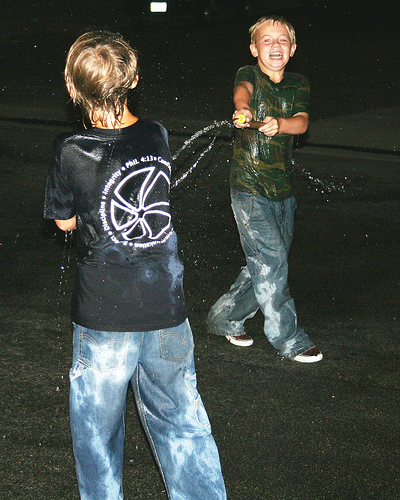

In [ ]:
# вывод соответствующего изображения
try:
    img_path = os.path.join(PATH, 'test_images', test_queries['query_id'].iloc[1].split('#')[0])
    img = Image.open(img_path).convert("RGB")
    display(img)  # Для Jupyter
    # Или для обычного Python:
    # img.show()
except Exception as e:
    print(f"Ошибка загрузки изображения: {str(e)}")

Действительно, данное изображение и описание относятся к запрещенным.

Попробуем вывести другое изображение по готовому описанию.

In [ ]:
# выводим описание
test_queries.iloc[13]['query_text']

'The woman lacrosse player in blue is about to catch the ball .'

Описание не содержит запрещенных слов, передадим его в функцию.


✅ Найдено изображение: 123997871_6a9ca987b1.jpg
Score: 1.0000


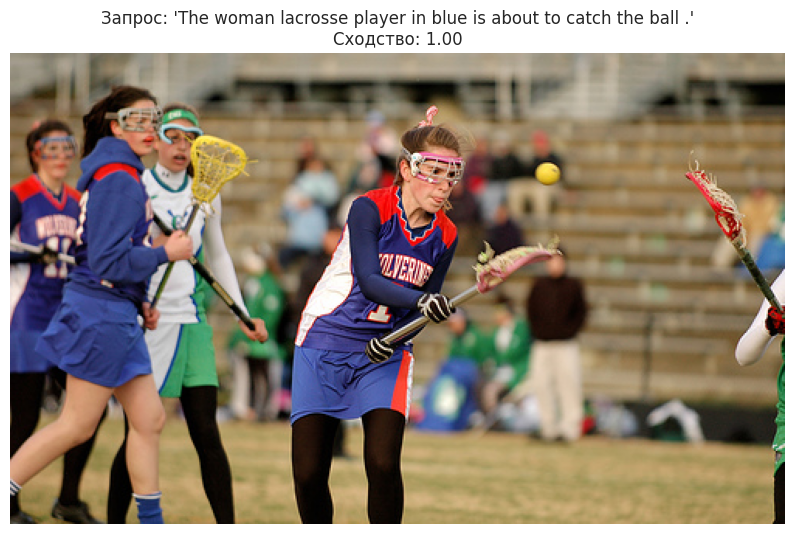

(<PIL.Image.Image image mode=RGB size=500x304>, np.float32(1.0))

In [ ]:
# Поиск по описанию
search_image_by_query(test_queries.iloc[13]['query_text'], show_image=True)

Выведем изображение, которому на самом деле принадлежит описание.

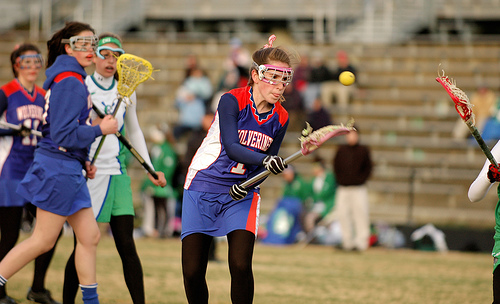

In [ ]:
# Вывод соответствующего изображения
try:
    img_path = os.path.join(PATH, 'test_images', test_queries['query_id'].iloc[13].split('#')[0])
    img = Image.open(img_path).convert("RGB")
    display(img)  # Для Jupyter
    # Или для обычного Python:
    # img.show()
except Exception as e:
    print(f"Ошибка загрузки изображения: {str(e)}")

Изображение и принадлежащее ему описание совпадают.

Проверим произвольный запрос.


✅ Найдено изображение: 2517284816_9b8fd3c6b6.jpg
Score: 1.0000


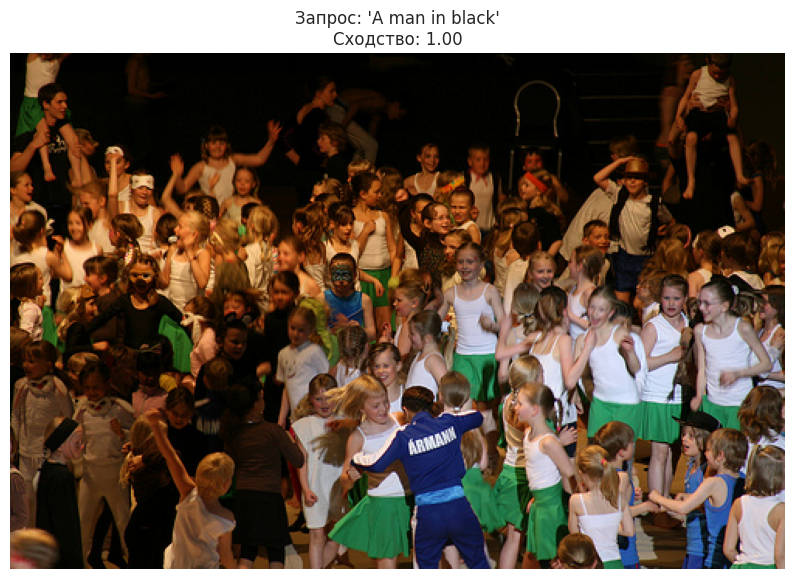

In [ ]:
# пример использования (минимальный вариант)
# с выводом внизу "служебной информации"
#search_image_by_query("A beautiful sunset over mountains")
# без вывода
result = search_image_by_query("A man in black")

Сходство в реальности (в отличии от мнения модели) невелико.

Проверим случайный запрос с запрещенным контентом.

In [ ]:
search_image_by_query("A girl swim")


🔴 Запрос содержит запрещённые слова!
This image is unavailable in your country in compliance with local laws.


(None, 0.0)

Запрос, содержащий запрещенные слова, блокируется.

Попробуем задать бессмысленный запрос.


✅ Найдено изображение: 2517284816_9b8fd3c6b6.jpg
Score: 1.0000


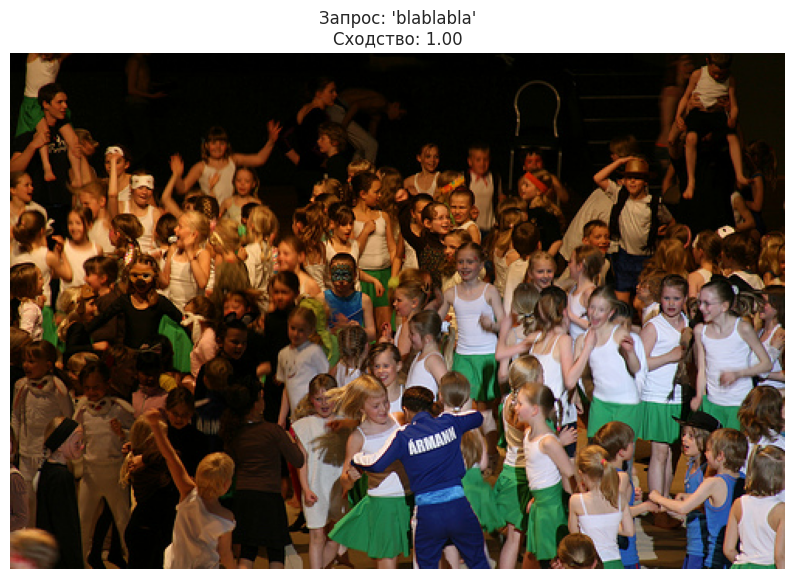

(<PIL.Image.Image image mode=RGB size=500x333>, np.float32(1.0))

In [ ]:
# попытка поймать бессмыслицу
search_image_by_query("blablabla")

Несмотря на то, что запрос не имеет смысла, модель сумела подобрать что-то с высоким соответствием даже для него.

При этом мы можем наблюдать, что в рамках данных запросов модель всегда крепко уверена в своих предсказаниях.

### **Вывод**

- При тестировании в рамках функции модель также показала низкое качество.
- Прямой запрос на запрещенный контент функция блокирует, однако ввиду низкого качества модели запрещенный контент все равно может быть выведен.
- Функция умеет обрабатывать не только описания из тестового датасета, но и произвольные запросы.
- Даже бессмысленным запросам модель находит совпадение, в соответствии запросу которых она сильно уверена.
- В рамках проверяемых запросов модель всегда крепко уверена в своих предсказаниях.
- Тестирование показало низкое качество модели.


## 8. Выводы

В рамках проекта стояла задача разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе покажет, насколько текст и картинка подходят друг другу.

- В ходе проекта были изучены и обработаны данные
- Выполнена векторизация изображений с помощью ResNet18, предварительно натренированной на датасете ImageNet.
- Выполнена векторизация текстов с помощью BERT 'bert-base-uncased'
- Обучены несколько моделей для оценки схожести текста и изображения: DummyModel (как базовая), LinearRegression, DecisionTreeRegressor, нейронная сеть.
- Лучший результат показала нейронная сеть, чья метрика RMSE при этом оказалась лишь чуть лучше таковой у базовой. На ней и проводилось тестирование.
- В рамках тестирования создана функция, возвращающая наиболее подходящее под описание фотографию и свою оценку их соответствия. Также функция блокирует запросы, содержащие указание на запрещенный контент.

К сожалению, результат работы модели оказался слабым, и она часто ошибается, лишь иногда показывает соответствие текста и изображения.

Рекомендуется:
- увеличить базу данных для обучения на большем количестве изображений;
- добавить большее количество текстовых описаний;
- оценить экспертами на соответсвие большее количество пар "описание-изображение".
- испытать другие методы векторизации текстов и изображений, агрегации оценок.
- поработать над параметрами и архитектурой нейронной сети.
- использовать готовое решение из зоопарка моделей, например, CLIP.

## Дополнительная работа



Как можно было увидеть ранее, метрика лучшей из моделей едва ли лучше базовой. Поэтому попробуем испытать одну из моделей из зоопарка, тк сэкономим время и получим более лучшие результаты.

Существует несколько нейросетей, способных решать эту задачу. Некоторые из них:

- ViT (Vision Transformer) - это недавно представленная нейронная сеть, которая основана на архитектуре трансформера, обученная на задаче классификации изображений. Может использоваться для поиска картинок по тексту.

- CLIP (Contrastive Language-Image Pre-Training) - это обученная на задаче двухуровневое представление, которое сочетает в себе картинки и текст, за счет чего возможен поиск изображений по тексту и наоборот.

- DALL-E - это генеративная нейросеть, обученная на создание изображений по текстовому описанию. Может использоваться для поиска изображений по тексту.

- VSE++ (Visual Semantic Embedding++) - это метод обучения мульти задачам, который использует взаимодействие между изображениями и текстами для обучения смежных вложений. Может использоваться для поиска изображений по тексту.

- DeViSE (Deep Visual-Semantic Embedding Model) - это метод, который использует обучение мульти задачам, чтобы создать взаимосвязь между изображениями и текстом с помощью кодирования изображений и текста в общее пространство вложений.

Мы воспользуемся самой первой:

CLIP-ViT-B/32 — это предварительно обученная модель Vision Transformer (ViT) для решения задачи машинного зрения и обработки естественного языка с использованием концепции искусственного интеллекта, разработанная OpenAI. Эта модель основана на архитектуре Transformer и использует предобученные векторные представления, которые позволяют моделировать как изображения, так и тексты. Она была создана для обработки естественого языка и изображений и предназначена для выполнения задачи joint image-text retrieval, то есть поиска связанных изображений и текстовых описаний. CLIP-ViT-B/32 обучается на огромном наборе данных, содержащем изображения и соответствующую текстовую информацию, и этот процесс занимает много времени и вычислительных ресурсов. Поэтому данный подход является одним из наиболее продвинутых методов deep learning для достижения высокой точности при решении задач машинного зрения и обработки естественного языка.

CLIP-ViT-B/32 является одним из самых мощных моделей представления изображений и текста на сегодняшний день. Она может быть использована для решения различных задач, таких как классификация изображений, распознавание объектов на изображении, обработка естественного языка, поиск похожих по смыслу изображений и текста и т.д.

Если рассматривать характеристики модели, то CLIP-ViT-B/32 имеет 32 слоя и содержит в себе 85,8 миллионов параметров. Она имеет широкий спектр приложений и может использоваться для задач классификации, обнаружения объектов, сегментации и многих других задач в области компьютерного зрения и обработки естественного языка.

In [ ]:
# загрузка библиотек
from pathlib import Path
#!pip install sentence_transformers
import sentence_transformers
from sentence_transformers import SentenceTransformer, util
import glob

In [ ]:
# Загрузим модель
model_vit = SentenceTransformer('clip-ViT-B-32')

# Создадим список путей до файла
file_paths = list(glob.glob(str(Path(PATH, 'test_images', '*.jpg')))) # glob.glob - возвращает список путей к файлам и директориям

# Подадим данный список в clip-ViT-B-32 и получим эмбединги
image_embed = model_vit.encode([Image.open(i) for i in file_paths],
                                   convert_to_tensor=True,
                                   batch_size=32,
                                   show_progress_bar=True)

image_embed.shape

modules.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/604 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

0_CLIPModel/pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Batches:   0%|          | 0/4 [00:00<?, ?it/s]

torch.Size([100, 512])

In [ ]:
def img_name(path):
    """Извлекает имя файла из пути"""
    name = ''
    for i in reversed(path):
        if i =='\\':
            break
        else:
            name += i
    return name[::-1]

counter_ban = 0
counter_true = 0

# Создаем шкалу прогресса
for i in tqdm(range(test_queries.shape[0]), desc="Обработка запросов", unit="запрос"):
    # Проверка на запрещенные слова
    bin_array = [i for i in test_queries.iloc[i]['query_text'].lower().split() if i in WORD_TO_BLOCK]

    if bin_array:
        counter_ban += 1
    else:
        # Векторизация текста
        image_embedings = model_vit.encode([test_queries.iloc[i]['query_text']],
                                         convert_to_tensor=True,
                                         show_progress_bar=False)

        # Поиск ближайшего изображения
        top = util.semantic_search(image_embedings, image_embed, top_k=1)[0]

        # Получаем истинное и предсказанное имена файлов
        target_name = test_queries.iloc[test_queries[test_queries['query_text'] == test_queries.iloc[i]['query_text']].index[0]]['image']
        predict_name = img_name(file_paths[top[0]['corpus_id']][-25:])

        # Сравниваем имена
        if target_name == predict_name:
            counter_true += 1

# Выводим итоговую статистику
print(f"\nЗавершено! Результаты:")
print(f"Запросов с запрещенными словами: {counter_ban}")
print(f"Правильных сопоставлений: {counter_true} из {test_queries.shape[0] - counter_ban}")
print(f"Точность (Правильно распознанных картинок): {counter_true / (test_queries.shape[0] - counter_ban) * 100:.2f}%")

Обработка запросов:   0%|          | 0/500 [00:00<?, ?запрос/s]


Завершено! Результаты:
Запросов с запрещенными словами: 169
Правильных сопоставлений: 215 из 331
Точность (Правильно распознанных картинок): 64.95%


In [ ]:
def accordance(query_text, k: int):
    """
    Функция для поиска и визуализации изображений по текстовому запросу
    с обработкой запрещенных слов и сравнением с эталонными изображениями

    Параметры:
    query_text (str): текстовый запрос для поиска изображений
    k (int): количество топовых результатов для отображения

    Возвращает:
    None (результаты выводятся графически)
    """
    # 1. Проверка на запрещенные слова
    # Используем переменную char вместо i для надежности (i уже было в другой функции)
    bin_array = [char for char in query_text.lower().split() if char in WORD_TO_BLOCK]

    if bin_array:
        # Если найдены запрещенные слова - выводим предупреждение
        print('-'*100)
        print(f"\n{query_text}\n")
        print('#'*77)
        s = 'This image is unavailable in your country in compliance with local laws'.upper()
        print(f'## {s} ##')
        print('#'*77)
        print()
    else:
        # 2. Векторизация текстового запроса
        image_embedings = model_vit.encode([query_text],
                                         convert_to_tensor=True,
                                         show_progress_bar=False)

        # 3. Поиск k наиболее похожих изображений
        top_results = util.semantic_search(image_embedings, image_embed, top_k=k)[0]  # Переименовал top в top_results

        # Вывод запроса
        print()
        print(query_text)
        print()

        # 4. Создание графического интерфейса с результатами
        fig = plt.figure(figsize=(15,6))
        plt.rcParams.update({
            'axes.edgecolor': 'white',
            'axes.linewidth': 5
        })

        # 5. Отображение k найденных изображений
        for idx, result in enumerate(top_results, 1):  # Заменил i на idx, top[i] на result
            fig.add_subplot(1, 6, idx, title=round(result['score'], 2))
            image = Image.open(file_paths[result['corpus_id']])
            plt.imshow(image)
            plt.axis('off')  # Упрощенный способ убрать оси
            plt.tight_layout()

        # 6. Если запрос есть в тестовой выборке - добавляем эталонное изображение
        if query_text in test_queries['query_text'].values:
            matched_row = test_queries[test_queries['query_text'] == query_text].iloc[0]
            plt.rcParams.update({
                'axes.edgecolor': 'green',
                'axes.linewidth': 5
            })

            # Добавляем эталонное изображение
            #fig.add_subplot(1, 6, 6)
            # Добавляем эталонное изображение с подписью
            ax = fig.add_subplot(1, 6, 6)
            try:
               # Добавляем подпись (без подписи-строку комментируем)
                ax.set_title("Эталонное \n изображение",
                             pad=10,)
                             #fontsize=8)
                image = Image.open(Path(PATH, 'test_images', matched_row['image']))
                plt.imshow(image)
                plt.axis('off')
                plt.tight_layout()
            except Exception as e:
                print(f"Не удалось загрузить эталонное изображение: {str(e)}")

        plt.show()
        print('-'*100)

    return None

----------------------------------------------------------------------------------------------------

The girl is blowing out the candles on the chocolate cake .

#############################################################################
## THIS IMAGE IS UNAVAILABLE IN YOUR COUNTRY IN COMPLIANCE WITH LOCAL LAWS ##
#############################################################################


A man demonstrating how high his black dog can jump .



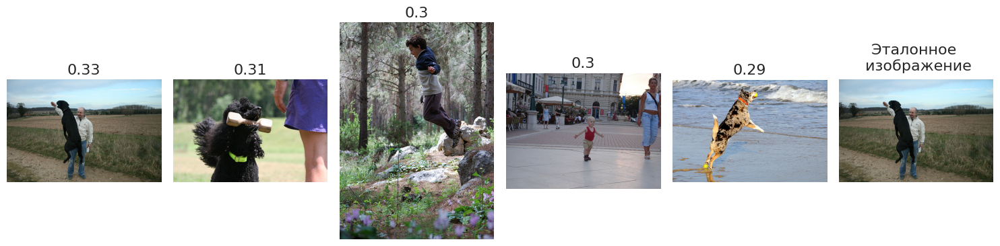

----------------------------------------------------------------------------------------------------

Closeup of a man at an event with formal attire .



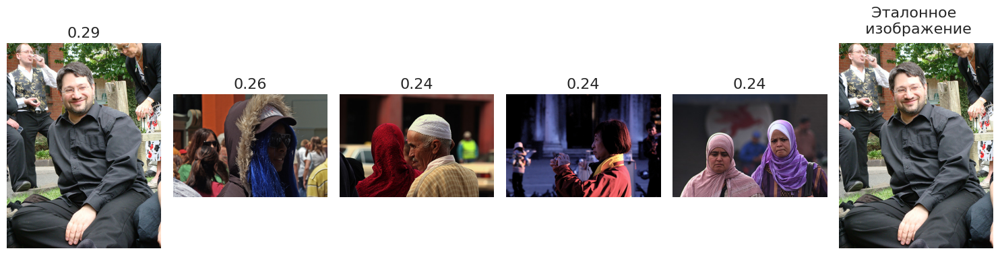

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

A woman in purple with two children in the mouth of a cave .

#############################################################################
## THIS IMAGE IS UNAVAILABLE IN YOUR COUNTRY IN COMPLIANCE WITH LOCAL LAWS ##
#############################################################################


The woman lacrosse player in blue is about to catch the ball .



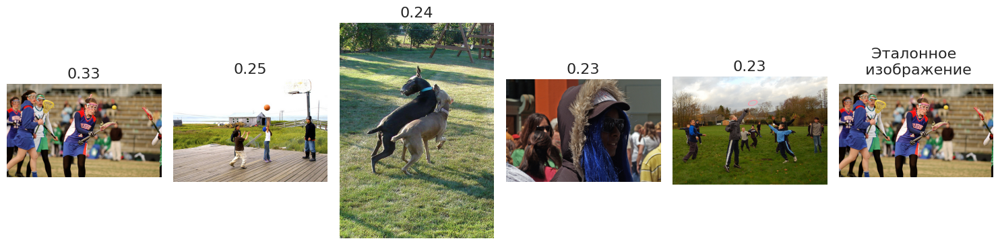

----------------------------------------------------------------------------------------------------


In [ ]:
# проведем проверку
k = 5
for query in list(test_queries.sample(k)['query_text']):
    accordance(query_text = query, k = k)

Модель из зоопарка показывает гораздо более лучший результат, чем обученная ранее в рамках проекта нейронная сеть.

### **Вывод**

Модель CLIP из зоопарка моделей даже на ограниченных данных показывает лучшие результаты, чем ранее натренированная сеть.